In [2]:
from itertools import islice

import matplotlib.dates as mdates
import pandas as pd
import torch
from gluonts.dataset.pandas import PandasDataset
from gluonts.dataset.repository.datasets import get_dataset
from gluonts.evaluation import Evaluator, make_evaluation_predictions
from lag_llama.gluon.estimator import LagLlamaEstimator
from matplotlib import pyplot as plt

from tqdm.autonotebook import tqdm

/home/abizard/miniconda3/envs/finetuning/lib/python3.12/site-packages/gluonts/json.py:101: UserWarning: Using `json`-module for json-handling. Consider installing one of `orjson`, `ujson` to speed up serialization and deserialization.
  warnings.warn(
/tmp/ipykernel_1059601/1477295042.py:12: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from tqdm.autonotebook import tqdm


In [3]:
import yfinance as yf

stock_prices = (
    yf.Tickers("aapl amd amzn crm goog meta msft nvda tsla")
    .history(period="max", start="2013-01-01")
    .Close
    .resample('1d')
    .ffill()
)

stock_prices

[*********************100%***********************]  9 of 9 completed


Ticker,AAPL,AMD,AMZN,CRM,GOOG,META,MSFT,NVDA,TSLA
Date,,,,,,,,,
2013-01-02 00:00:00+00:00,16.705708,2.530000,12.865500,42.603367,17.969599,27.915949,22.451809,0.293535,2.357333
2013-01-03 00:00:00+00:00,16.494843,2.490000,12.924000,41.991089,17.980036,27.686640,22.151049,0.293766,2.318000
2013-01-04 00:00:00+00:00,16.035379,2.590000,12.957500,42.215092,18.335327,28.673668,21.736479,0.303458,2.293333
2013-01-05 00:00:00+00:00,16.035379,2.590000,12.957500,42.215092,18.335327,28.673668,21.736479,0.303458,2.293333
2013-01-06 00:00:00+00:00,16.035379,2.590000,12.957500,42.215092,18.335327,28.673668,21.736479,0.303458,2.293333
...,...,...,...,...,...,...,...,...,...
2024-09-21 00:00:00+00:00,228.199997,155.949997,191.600006,266.799988,164.639999,561.349976,435.269989,116.000000,238.250000
2024-09-22 00:00:00+00:00,228.199997,155.949997,191.600006,266.799988,164.639999,561.349976,435.269989,116.000000,238.250000
2024-09-23 00:00:00+00:00,226.470001,156.750000,193.880005,264.209991,163.070007,564.409973,433.510010,116.260002,250.000000


In [4]:
stock_returns = stock_prices.rolling(5).mean().pct_change().dropna()

stock_returns

Ticker,AAPL,AMD,AMZN,CRM,GOOG,META,MSFT,NVDA,TSLA
Date,,,,,,,,,
2013-01-07 00:00:00+00:00,-0.009405,0.010946,0.008622,-0.002580,0.003141,0.009996,-0.006884,0.000770,-0.005885
2013-01-08 00:00:00+00:00,-0.006343,0.013921,0.006056,0.001488,0.002622,0.008991,-0.005218,-0.003695,-0.006326
2013-01-09 00:00:00+00:00,-0.003764,0.003051,0.005487,0.002619,0.000041,0.012642,-0.000300,-0.014526,-0.004439
2013-01-10 00:00:00+00:00,-0.001332,0.002281,0.004691,0.004129,0.000953,0.017327,-0.002099,-0.014427,-0.005104
2013-01-11 00:00:00+00:00,-0.002560,0.006070,0.006631,0.004382,0.000548,0.019848,0.000676,-0.014956,-0.008786
...,...,...,...,...,...,...,...,...,...
2024-09-21 00:00:00+00:00,0.010694,0.005066,0.007141,0.007939,0.006993,0.010290,0.001810,-0.001346,0.009854
2024-09-22 00:00:00+00:00,0.010163,0.006682,0.004987,0.009190,0.005359,0.009082,0.000055,0.000708,0.008830
2024-09-23 00:00:00+00:00,0.005096,0.010946,0.007833,0.008932,0.002763,0.009514,0.001241,0.004989,0.019226


In [5]:
def _get_lag_llama_dataset(dataset):
    dataset = dataset.copy()

    for col in dataset.columns:
        if dataset[col].dtype != "object" and not pd.api.types.is_string_dtype(dataset[col]):
            dataset[col] = dataset[col].astype("float32")

    backtest_dataset = PandasDataset(dict(dataset))
    return backtest_dataset

train_dataset = _get_lag_llama_dataset(stock_returns.iloc[:3418])
test_dataset = _get_lag_llama_dataset(stock_returns.iloc[3418:])

new_train_ds = _get_lag_llama_dataset(stock_returns.iloc[:252*5])
new_test_ds = _get_lag_llama_dataset(stock_returns.iloc[252*5:])

# train_dataset = _get_lag_llama_dataset(stock_prices.iloc[:3418])
# test_dataset = _get_lag_llama_dataset(stock_prices.iloc[3418:])

prediction_length = 60
num_samples = 1060
device = torch.device("cuda:0")

In [6]:
ckpt = torch.load("./lag-llama-model/lag-llama.ckpt", map_location=device) # Uses GPU since in this Colab we use a GPU.
estimator_args = ckpt["hyper_parameters"]["model_kwargs"]

def _new_get_lag_llama_predictions(path, dataset, prediction_length, device, context_length=32, use_rope_scaling=False, num_samples=100):

    rope_scaling_arguments = {
        "type": "linear",
        "factor": max(1.0, (context_length + prediction_length) / estimator_args["context_length"]),
    }

    estimator = LagLlamaEstimator(
        ckpt_path=path,
        prediction_length=prediction_length,
        context_length=context_length, # Lag-Llama was trained with a context length of 32, but can work with any context length

        # estimator args
        input_size=estimator_args["input_size"],
        n_layer=estimator_args["n_layer"],
        n_embd_per_head=estimator_args["n_embd_per_head"],
        n_head=estimator_args["n_head"],
        scaling=estimator_args["scaling"],
        time_feat=estimator_args["time_feat"],
        rope_scaling=rope_scaling_arguments if use_rope_scaling else None,

        batch_size=1,
        num_parallel_samples=100,
        device=device,
    )

    lightning_module = estimator.create_lightning_module()
    transformation = estimator.create_transformation()
    predictor = estimator.create_predictor(transformation, lightning_module)

    forecast_it, ts_it = make_evaluation_predictions(
        dataset=dataset,
        predictor=predictor,
        num_samples=num_samples
    )
    forecasts = list(forecast_it)
    tss = list(ts_it)

    return forecasts, tss

/tmp/ipykernel_1059601/1143030989.py:1: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  ckpt = torch.load("./lag-llama-model/lag-llama.ckpt", map_location=device) # Uses GPU s

/home/abizard/miniconda3/envs/finetuning/lib/python3.12/site-packages/lightning/fabric/utilities/cloud_io.py:56: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
/home/abizard/miniconda3/envs/f

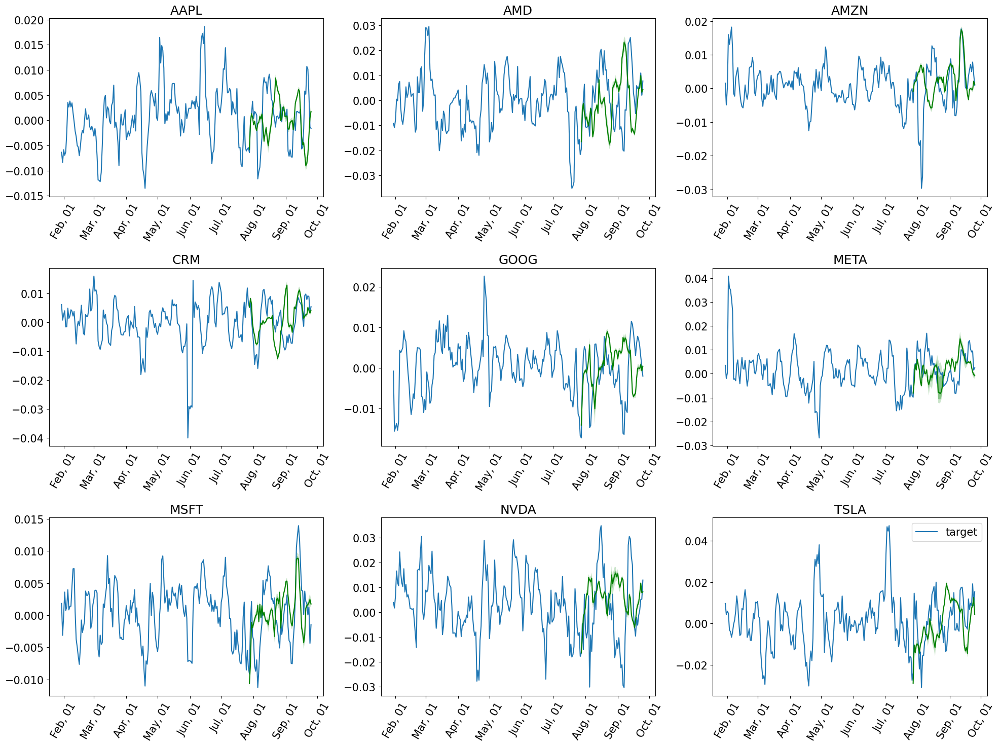

Running evaluation: 9it [00:00, 224.47it/s]
/home/abizard/miniconda3/envs/finetuning/lib/python3.12/site-packages/gluonts/json.py:101: UserWarning: Using `json`-module for json-handling. Consider installing one of `orjson`, `ujson` to speed up serialization and deserialization.
  warnings.warn(


CRPS: 1.1500843857415175
WQL: 1.0477813769125137
MSE: 0.00013141996438477052
MAPE: 3.469970321655273
RMSE: 0.01146385469136671
MASE: 1.910426391521445


In [6]:
forecasts_new, tss_new = _new_get_lag_llama_predictions("./lightning_logs/version_1/checkpoints/epoch=49-step=2500.ckpt", \
                                                            test_dataset, prediction_length=prediction_length, device=device,\
                                                            use_rope_scaling=False, num_samples=num_samples)

plt.figure(figsize=(20, 15))
date_formater = mdates.DateFormatter("%b, %d")
plt.rcParams.update({"font.size": 15})

# iterate through the series, plot the predicted samples
for idx, (forecast, ts) in islice(enumerate(zip(forecasts_new, tss_new)), 9):
    ax = plt.subplot(3, 3, idx + 1)

    plt.plot(
        ts[(-4 * prediction_length):].to_timestamp(),
        label="target",
    )
    forecast.plot(color="g")
    plt.xticks(rotation=60)
    ax.xaxis.set_major_formatter(date_formater)
    ax.set_title(forecast.item_id)

plt.gcf().tight_layout()
plt.legend()
plt.show()

evaluator = Evaluator()
agg_metrics_new, ts_metrics_new = evaluator(iter(tss_new), iter(forecasts_new))
print('CRPS:', agg_metrics_new['mean_wQuantileLoss'])
print('WQL:', agg_metrics_new['wQuantileLoss[0.9]'])
print('MSE:', agg_metrics_new['MSE'])
print('MAPE:', agg_metrics_new['MAPE'])
print('RMSE:', agg_metrics_new['RMSE'])
print('MASE:', agg_metrics_new['MASE'])

Learning Rate 0,0005

/home/abizard/miniconda3/envs/finetuning/lib/python3.12/site-packages/lightning/fabric/utilities/cloud_io.py:56: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
/home/abizard/miniconda3/envs/f

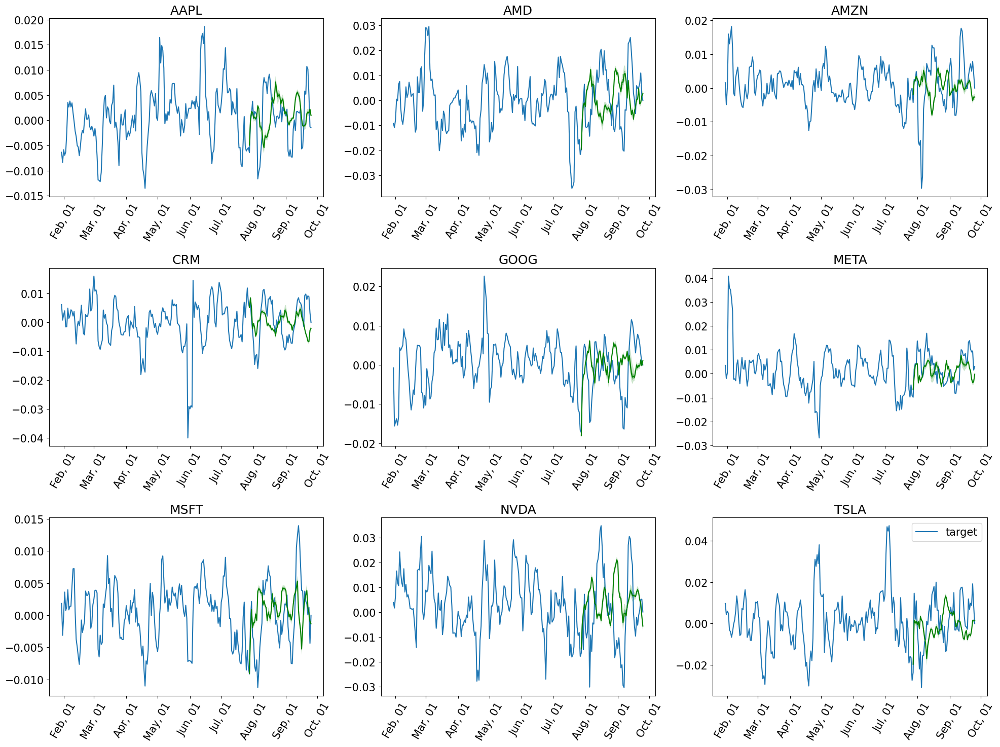

Running evaluation: 9it [00:00, 260.53it/s]


CRPS: 1.1184778309828052
WQL: 1.0546549705824326
MSE: 0.00011988486146071443
MAPE: 2.4648571500520773
RMSE: 0.01094919455762452
MASE: 1.826375674200258


/home/abizard/miniconda3/envs/finetuning/lib/python3.12/site-packages/gluonts/json.py:101: UserWarning: Using `json`-module for json-handling. Consider installing one of `orjson`, `ujson` to speed up serialization and deserialization.
  warnings.warn(


In [8]:
forecasts_new_32_1, tss_new_32_1 = _new_get_lag_llama_predictions("./lightning_logs/version_1 (32, 0,0005)/checkpoints/epoch=47-step=2400.ckpt", \
                                                            test_dataset, prediction_length=prediction_length, device=device,\
                                                            use_rope_scaling=False, num_samples=num_samples)

plt.figure(figsize=(20, 15))
date_formater = mdates.DateFormatter("%b, %d")
plt.rcParams.update({"font.size": 15})

# iterate through the series, plot the predicted samples
for idx, (forecast, ts) in islice(enumerate(zip(forecasts_new_32_1, tss_new_32_1)), 9):
    ax = plt.subplot(3, 3, idx + 1)

    plt.plot(
        ts[(-4 * prediction_length):].to_timestamp(),
        label="target",
    )
    forecast.plot(color="g")
    plt.xticks(rotation=60)
    ax.xaxis.set_major_formatter(date_formater)
    ax.set_title(forecast.item_id)

plt.gcf().tight_layout()
plt.legend()
plt.show()

evaluator = Evaluator()
agg_metrics_32_1, ts_metrics_32_1 = evaluator(iter(tss_new_32_1), iter(forecasts_new_32_1))
print('CRPS:', agg_metrics_32_1['mean_wQuantileLoss'])
print('WQL:', agg_metrics_32_1['wQuantileLoss[0.9]'])
print('MSE:', agg_metrics_32_1['MSE'])
print('MAPE:', agg_metrics_32_1['MAPE'])
print('RMSE:', agg_metrics_32_1['RMSE'])
print('MASE:', agg_metrics_32_1['MASE'])

/home/abizard/miniconda3/envs/finetuning/lib/python3.12/site-packages/lightning/fabric/utilities/cloud_io.py:56: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
/home/abizard/miniconda3/envs/f

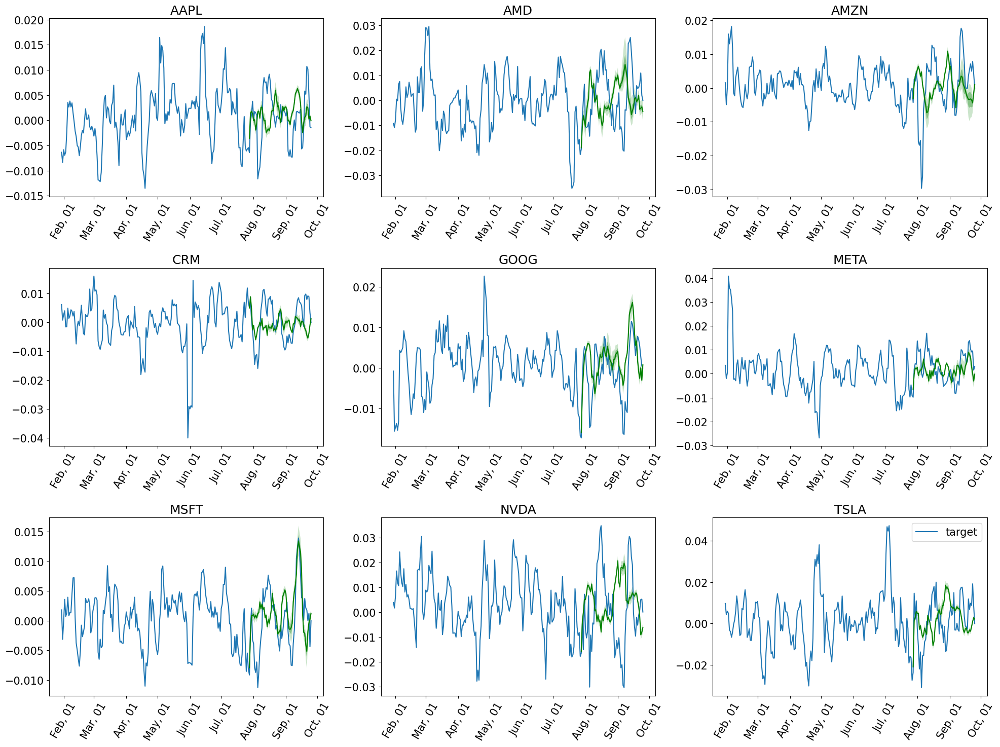

Running evaluation: 9it [00:00, 1337.61it/s]


CRPS: 1.1170356288152334
WQL: 0.9592149694203346
MSE: 0.0001300643905307408
MAPE: 2.519482392660118
RMSE: 0.011404577612991233
MASE: 1.826221322719729


/home/abizard/miniconda3/envs/finetuning/lib/python3.12/site-packages/gluonts/json.py:101: UserWarning: Using `json`-module for json-handling. Consider installing one of `orjson`, `ujson` to speed up serialization and deserialization.
  warnings.warn(


In [9]:
forecasts_new_64_1, tss_new_64_1 = _new_get_lag_llama_predictions("./lightning_logs/version_3 (64, 0,0005)/checkpoints/epoch=48-step=2450.ckpt", \
                                                            test_dataset, prediction_length=prediction_length, device=device,\
                                                            use_rope_scaling=False, num_samples=num_samples)

plt.figure(figsize=(20, 15))
date_formater = mdates.DateFormatter("%b, %d")
plt.rcParams.update({"font.size": 15})

# iterate through the series, plot the predicted samples
for idx, (forecast, ts) in islice(enumerate(zip(forecasts_new_64_1, tss_new_64_1)), 9):
    ax = plt.subplot(3, 3, idx + 1)

    plt.plot(
        ts[(-4 * prediction_length):].to_timestamp(),
        label="target",
    )
    forecast.plot(color="g")
    plt.xticks(rotation=60)
    ax.xaxis.set_major_formatter(date_formater)
    ax.set_title(forecast.item_id)

plt.gcf().tight_layout()
plt.legend()
plt.show()

evaluator = Evaluator()
agg_metrics_64_1, ts_metrics_64_1 = evaluator(iter(tss_new_64_1), iter(forecasts_new_64_1))
print('CRPS:', agg_metrics_64_1['mean_wQuantileLoss'])
print('WQL:', agg_metrics_64_1['wQuantileLoss[0.9]'])
print('MSE:', agg_metrics_64_1['MSE'])
print('MAPE:', agg_metrics_64_1['MAPE'])
print('RMSE:', agg_metrics_64_1['RMSE'])
print('MASE:', agg_metrics_64_1['MASE'])

/home/abizard/miniconda3/envs/finetuning/lib/python3.12/site-packages/lightning/fabric/utilities/cloud_io.py:56: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
/home/abizard/miniconda3/envs/f

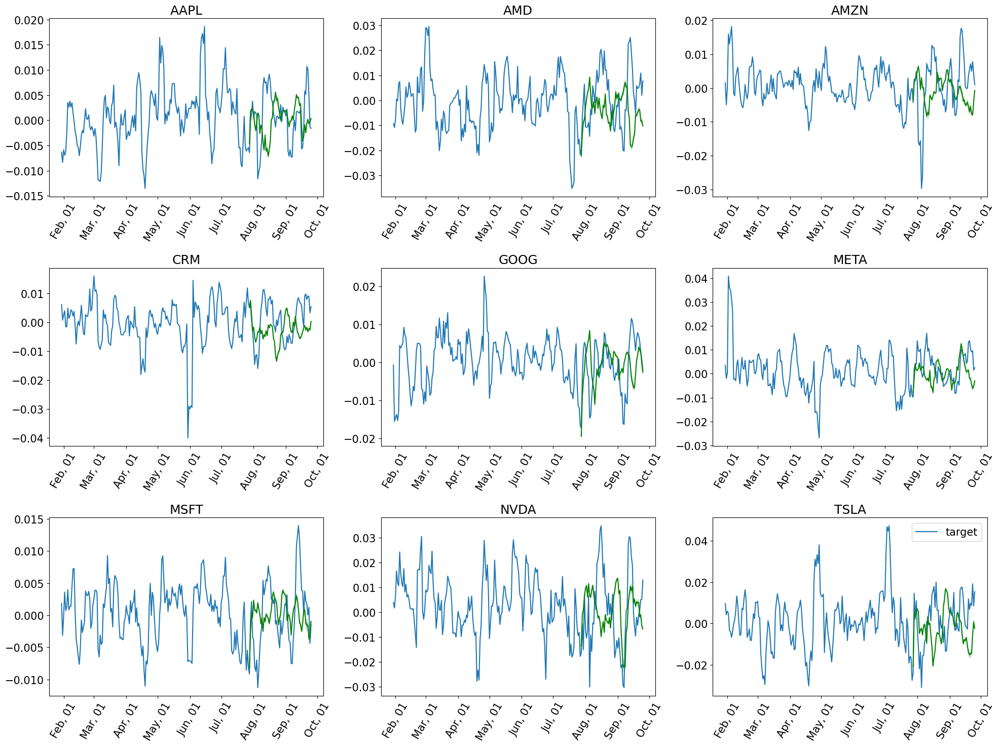

Running evaluation: 9it [00:00, 253.72it/s]
/home/abizard/miniconda3/envs/finetuning/lib/python3.12/site-packages/gluonts/json.py:101: UserWarning: Using `json`-module for json-handling. Consider installing one of `orjson`, `ujson` to speed up serialization and deserialization.
  warnings.warn(


CRPS: 1.2133141078652123
WQL: 1.3895294847551574
MSE: 0.00013547515155988988
MAPE: 3.0543866899278425
RMSE: 0.011639379345991343
MASE: 1.9765098922639797


In [7]:
forecasts_new_128_1, tss_new_128_1 = _new_get_lag_llama_predictions("./lightning_logs/version_6B (128, 0,0005)/checkpoints/epoch=49-step=2500.ckpt", \
                                                            test_dataset, prediction_length=prediction_length, device=device,\
                                                            use_rope_scaling=False, num_samples=num_samples)

plt.figure(figsize=(20, 15))
date_formater = mdates.DateFormatter("%b, %d")
plt.rcParams.update({"font.size": 15})

# iterate through the series, plot the predicted samples
for idx, (forecast, ts) in islice(enumerate(zip(forecasts_new_128_1, tss_new_128_1)), 9):
    ax = plt.subplot(3, 3, idx + 1)

    plt.plot(
        ts[(-4 * prediction_length):].to_timestamp(),
        label="target",
    )
    forecast.plot(color="g")
    plt.xticks(rotation=60)
    ax.xaxis.set_major_formatter(date_formater)
    ax.set_title(forecast.item_id)

plt.gcf().tight_layout()
plt.legend()
plt.show()

evaluator = Evaluator()
agg_metrics_128_1, ts_metrics_128_1 = evaluator(iter(tss_new_128_1), iter(forecasts_new_128_1))
print('CRPS:', agg_metrics_128_1['mean_wQuantileLoss'])
print('WQL:', agg_metrics_128_1['wQuantileLoss[0.9]'])
print('MSE:', agg_metrics_128_1['MSE'])
print('MAPE:', agg_metrics_128_1['MAPE'])
print('RMSE:', agg_metrics_128_1['RMSE'])
print('MASE:', agg_metrics_128_1['MASE'])

/home/abizard/miniconda3/envs/finetuning/lib/python3.12/site-packages/lightning/fabric/utilities/cloud_io.py:56: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
/home/abizard/miniconda3/envs/f

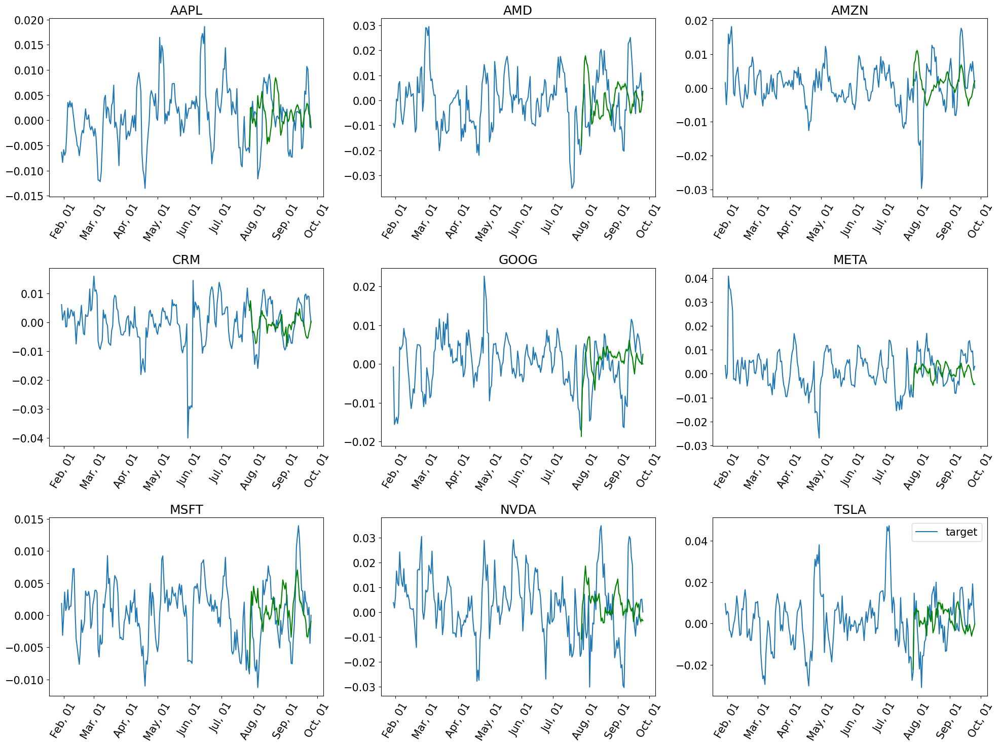

Running evaluation: 9it [00:00, 879.88it/s]


CRPS: 1.118673951162857
WQL: 1.0562709927843297
MSE: 0.00011162433958681368
MAPE: 2.652728998024959
RMSE: 0.010565242050554908
MASE: 1.8006833302611216


/home/abizard/miniconda3/envs/finetuning/lib/python3.12/site-packages/gluonts/json.py:101: UserWarning: Using `json`-module for json-handling. Consider installing one of `orjson`, `ujson` to speed up serialization and deserialization.
  warnings.warn(


In [12]:
forecasts_new_256_1, tss_new_256_1 = _new_get_lag_llama_predictions("./lightning_logs/version_7 (256, 0,0005)/checkpoints/epoch=47-step=2400.ckpt", \
                                                            test_dataset, prediction_length=prediction_length, device=device,\
                                                            use_rope_scaling=False, num_samples=num_samples)

plt.figure(figsize=(20, 15))
date_formater = mdates.DateFormatter("%b, %d")
plt.rcParams.update({"font.size": 15})

# iterate through the series, plot the predicted samples
for idx, (forecast, ts) in islice(enumerate(zip(forecasts_new_256_1, tss_new_256_1)), 9):
    ax = plt.subplot(3, 3, idx + 1)

    plt.plot(
        ts[(-4 * prediction_length):].to_timestamp(),
        label="target",
    )
    forecast.plot(color="g")
    plt.xticks(rotation=60)
    ax.xaxis.set_major_formatter(date_formater)
    ax.set_title(forecast.item_id)

plt.gcf().tight_layout()
plt.legend()
plt.show()

evaluator = Evaluator()
agg_metrics_256_1, ts_metrics_256_1 = evaluator(iter(tss_new_256_1), iter(forecasts_new_256_1))
print('CRPS:', agg_metrics_256_1['mean_wQuantileLoss'])
print('WQL:', agg_metrics_256_1['wQuantileLoss[0.9]'])
print('MSE:', agg_metrics_256_1['MSE'])
print('MAPE:', agg_metrics_256_1['MAPE'])
print('RMSE:', agg_metrics_256_1['RMSE'])
print('MASE:', agg_metrics_256_1['MASE'])

/home/abizard/miniconda3/envs/finetuning/lib/python3.12/site-packages/lightning/fabric/utilities/cloud_io.py:56: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
/home/abizard/miniconda3/envs/f

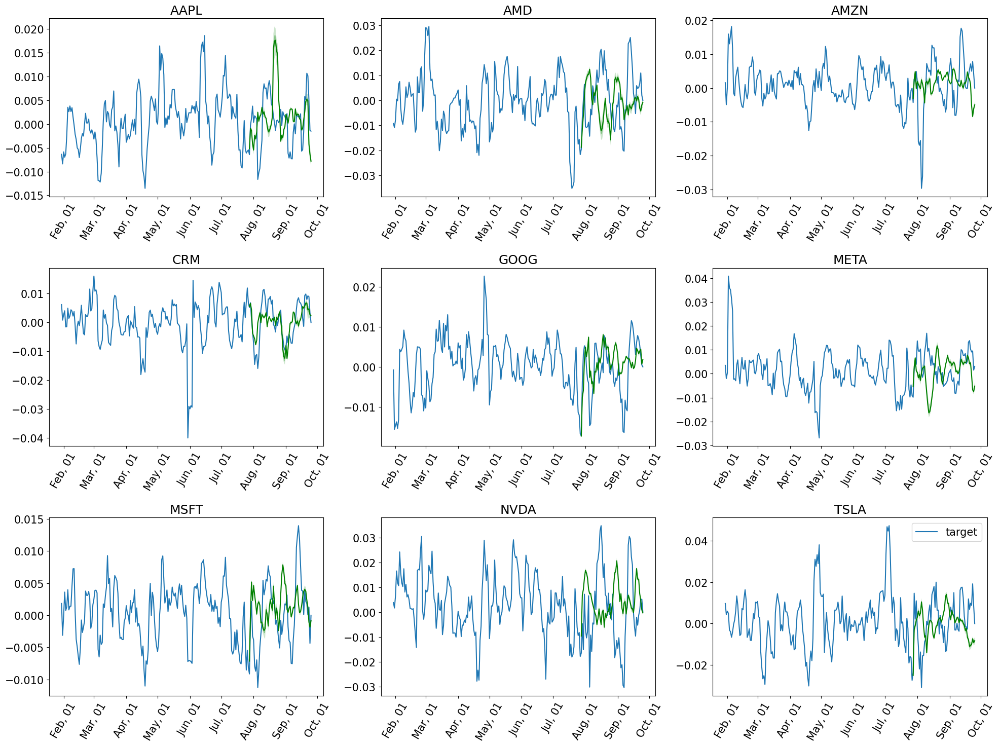

Running evaluation: 9it [00:00, 302.43it/s]
/home/abizard/miniconda3/envs/finetuning/lib/python3.12/site-packages/gluonts/json.py:101: UserWarning: Using `json`-module for json-handling. Consider installing one of `orjson`, `ujson` to speed up serialization and deserialization.
  warnings.warn(


CRPS: 1.1763994122792252
WQL: 1.0932039821030424
MSE: 0.0001320562661728925
MAPE: 2.9187233541121067
RMSE: 0.01149157370306141
MASE: 1.9046114111545565


In [13]:
forecasts_new_512_1, tss_new_512_1 = _new_get_lag_llama_predictions("./lightning_logs/version_5 (512, 0,0005)/checkpoints/epoch=49-step=2500.ckpt", \
                                                            test_dataset, prediction_length=prediction_length, device=device,\
                                                            use_rope_scaling=False, num_samples=num_samples)

plt.figure(figsize=(20, 15))
date_formater = mdates.DateFormatter("%b, %d")
plt.rcParams.update({"font.size": 15})

# iterate through the series, plot the predicted samples
for idx, (forecast, ts) in islice(enumerate(zip(forecasts_new_512_1, tss_new_512_1)), 9):
    ax = plt.subplot(3, 3, idx + 1)

    plt.plot(
        ts[(-4 * prediction_length):].to_timestamp(),
        label="target",
    )
    forecast.plot(color="g")
    plt.xticks(rotation=60)
    ax.xaxis.set_major_formatter(date_formater)
    ax.set_title(forecast.item_id)

plt.gcf().tight_layout()
plt.legend()
plt.show()

evaluator = Evaluator()
agg_metrics_512_1, ts_metrics_512_1 = evaluator(iter(tss_new_512_1), iter(forecasts_new_512_1))
print('CRPS:', agg_metrics_512_1['mean_wQuantileLoss'])
print('WQL:', agg_metrics_512_1['wQuantileLoss[0.9]'])
print('MSE:', agg_metrics_512_1['MSE'])
print('MAPE:', agg_metrics_512_1['MAPE'])
print('RMSE:', agg_metrics_512_1['RMSE'])
print('MASE:', agg_metrics_512_1['MASE'])

Learning Rate 0,0001

/home/abizard/miniconda3/envs/finetuning/lib/python3.12/site-packages/lightning/fabric/utilities/cloud_io.py:56: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
/home/abizard/miniconda3/envs/f

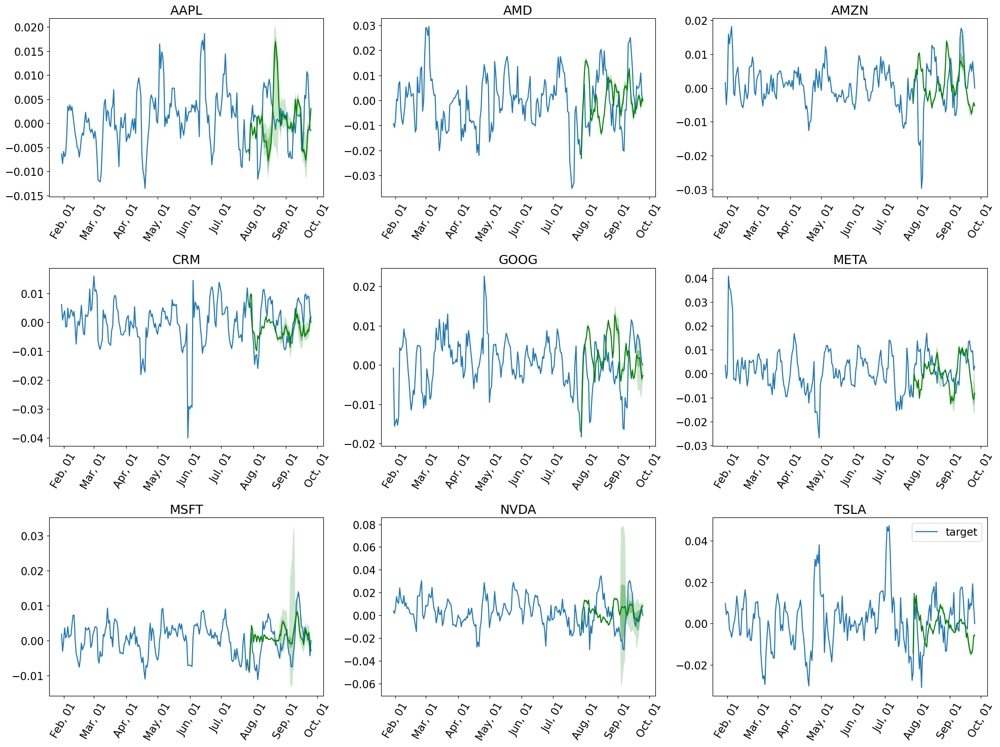

Running evaluation: 9it [00:00, 296.21it/s]
/home/abizard/miniconda3/envs/finetuning/lib/python3.12/site-packages/gluonts/json.py:101: UserWarning: Using `json`-module for json-handling. Consider installing one of `orjson`, `ujson` to speed up serialization and deserialization.
  warnings.warn(


CRPS: 1.1322142431688689
WQL: 1.098558579858789
MSE: 0.00012728052916591642
MAPE: 2.7034254353074854
RMSE: 0.011281867273014536
MASE: 1.9319784051937046


In [14]:
forecasts_new_32_2, tss_new_32_2 = _new_get_lag_llama_predictions("./lightning_logs/version_8 (32, 0,0001)/checkpoints/epoch=49-step=2500.ckpt", \
                                                            test_dataset, prediction_length=prediction_length, device=device,\
                                                            use_rope_scaling=False, num_samples=num_samples)

plt.figure(figsize=(20, 15))
date_formater = mdates.DateFormatter("%b, %d")
plt.rcParams.update({"font.size": 15})

# iterate through the series, plot the predicted samples
for idx, (forecast, ts) in islice(enumerate(zip(forecasts_new_32_2, tss_new_32_2)), 9):
    ax = plt.subplot(3, 3, idx + 1)

    plt.plot(
        ts[(-4 * prediction_length):].to_timestamp(),
        label="target",
    )
    forecast.plot(color="g")
    plt.xticks(rotation=60)
    ax.xaxis.set_major_formatter(date_formater)
    ax.set_title(forecast.item_id)

plt.gcf().tight_layout()
plt.legend()
plt.show()

evaluator = Evaluator()
agg_metrics_32_2, ts_metrics_32_2 = evaluator(iter(tss_new_32_2), iter(forecasts_new_32_2))
print('CRPS:', agg_metrics_32_2['mean_wQuantileLoss'])
print('WQL:', agg_metrics_32_2['wQuantileLoss[0.9]'])
print('MSE:', agg_metrics_32_2['MSE'])
print('MAPE:', agg_metrics_32_2['MAPE'])
print('RMSE:', agg_metrics_32_2['RMSE'])
print('MASE:', agg_metrics_32_2['MASE'])

/home/abizard/miniconda3/envs/finetuning/lib/python3.12/site-packages/lightning/fabric/utilities/cloud_io.py:56: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
/home/abizard/miniconda3/envs/f

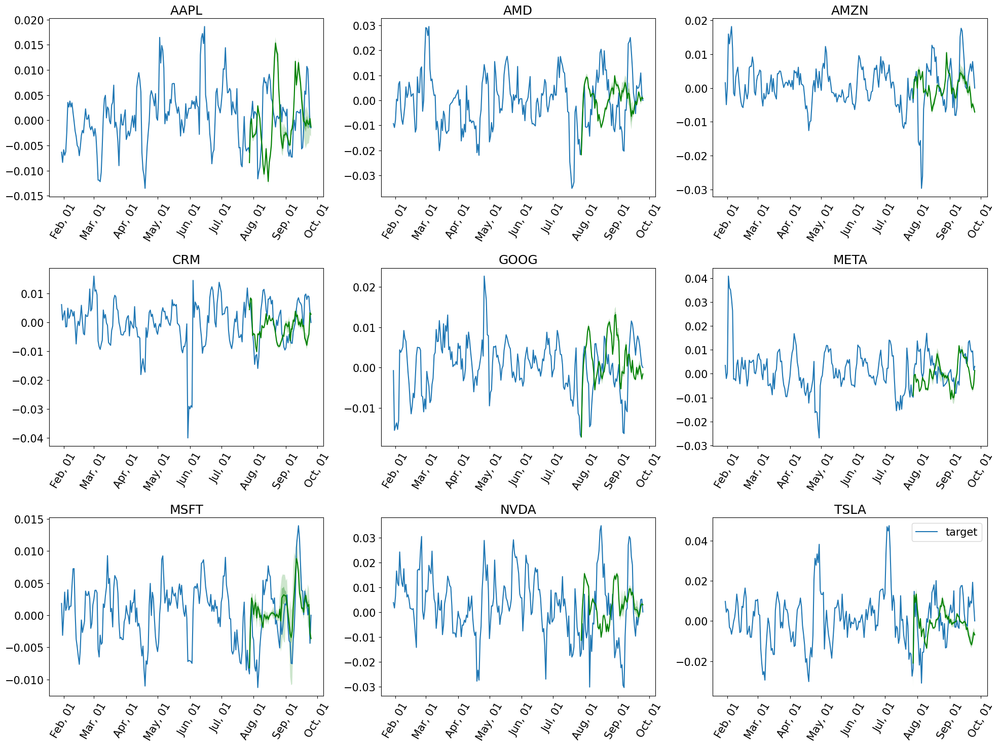

Running evaluation: 9it [00:00, 161.71it/s]
/home/abizard/miniconda3/envs/finetuning/lib/python3.12/site-packages/gluonts/json.py:101: UserWarning: Using `json`-module for json-handling. Consider installing one of `orjson`, `ujson` to speed up serialization and deserialization.
  warnings.warn(


CRPS: 1.1734938464016533
WQL: 1.1858880305632216
MSE: 0.00012756451852274713
MAPE: 2.683276778111575
RMSE: 0.011294446357513374
MASE: 1.9627024657536678


In [15]:
forecasts_new_64_2, tss_new_64_2 = _new_get_lag_llama_predictions("./lightning_logs/version_9 (64, 0,0001)/checkpoints/epoch=48-step=2450.ckpt", \
                                                            test_dataset, prediction_length=prediction_length, device=device,\
                                                            use_rope_scaling=False, num_samples=num_samples)

plt.figure(figsize=(20, 15))
date_formater = mdates.DateFormatter("%b, %d")
plt.rcParams.update({"font.size": 15})

# iterate through the series, plot the predicted samples
for idx, (forecast, ts) in islice(enumerate(zip(forecasts_new_64_2, tss_new_64_2)), 9):
    ax = plt.subplot(3, 3, idx + 1)

    plt.plot(
        ts[(-4 * prediction_length):].to_timestamp(),
        label="target",
    )
    forecast.plot(color="g")
    plt.xticks(rotation=60)
    ax.xaxis.set_major_formatter(date_formater)
    ax.set_title(forecast.item_id)

plt.gcf().tight_layout()
plt.legend()
plt.show()

evaluator = Evaluator()
agg_metrics_64_2, ts_metrics_64_2 = evaluator(iter(tss_new_64_2), iter(forecasts_new_64_2))
print('CRPS:', agg_metrics_64_2['mean_wQuantileLoss'])
print('WQL:', agg_metrics_64_2['wQuantileLoss[0.9]'])
print('MSE:', agg_metrics_64_2['MSE'])
print('MAPE:', agg_metrics_64_2['MAPE'])
print('RMSE:', agg_metrics_64_2['RMSE'])
print('MASE:', agg_metrics_64_2['MASE'])

/home/abizard/miniconda3/envs/finetuning/lib/python3.12/site-packages/lightning/fabric/utilities/cloud_io.py:56: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
/home/abizard/miniconda3/envs/f

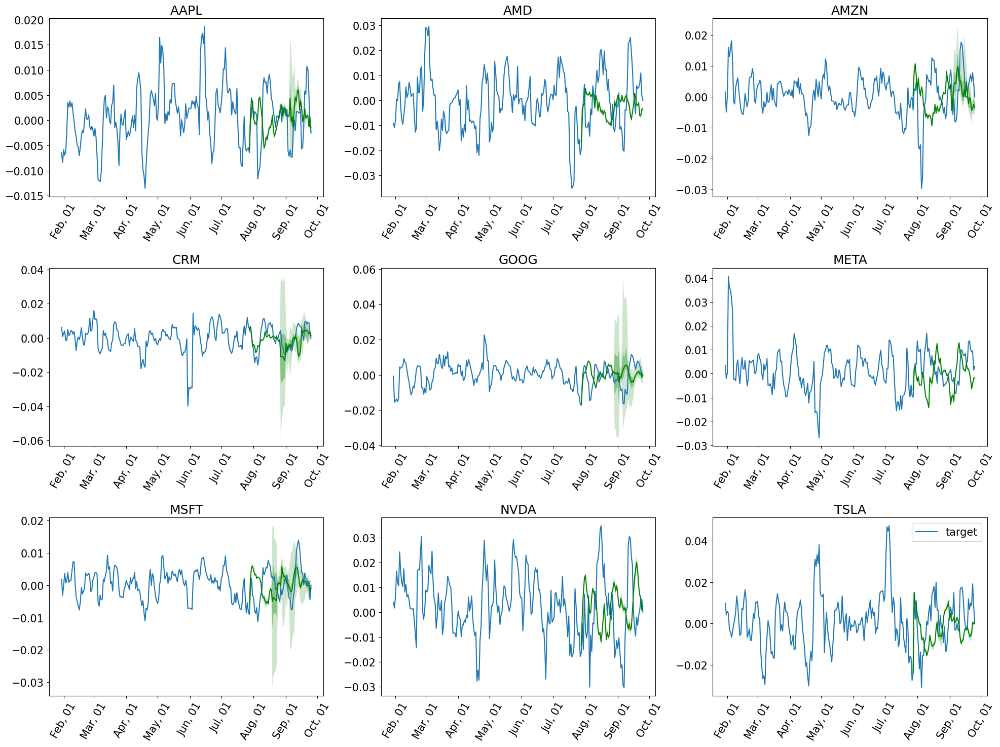

Running evaluation: 9it [00:00, 276.06it/s]


CRPS: 1.2060774813787587
WQL: 1.2539426088071108
MSE: 0.00013888524284724285
MAPE: 2.622925586784253
RMSE: 0.011784958330314234
MASE: 2.006717976460019


/home/abizard/miniconda3/envs/finetuning/lib/python3.12/site-packages/gluonts/json.py:101: UserWarning: Using `json`-module for json-handling. Consider installing one of `orjson`, `ujson` to speed up serialization and deserialization.
  warnings.warn(


In [16]:
forecasts_new_128_2, tss_new_128_2 = _new_get_lag_llama_predictions("./lightning_logs/version_10 (128, 0,0001)/checkpoints/epoch=48-step=2450.ckpt", \
                                                            test_dataset, prediction_length=prediction_length, device=device,\
                                                            use_rope_scaling=False, num_samples=num_samples)

plt.figure(figsize=(20, 15))
date_formater = mdates.DateFormatter("%b, %d")
plt.rcParams.update({"font.size": 15})

# iterate through the series, plot the predicted samples
for idx, (forecast, ts) in islice(enumerate(zip(forecasts_new_128_2, tss_new_128_2)), 9):
    ax = plt.subplot(3, 3, idx + 1)

    plt.plot(
        ts[(-4 * prediction_length):].to_timestamp(),
        label="target",
    )
    forecast.plot(color="g")
    plt.xticks(rotation=60)
    ax.xaxis.set_major_formatter(date_formater)
    ax.set_title(forecast.item_id)

plt.gcf().tight_layout()
plt.legend()
plt.show()

evaluator = Evaluator()
agg_metrics_128_2, ts_metrics_128_2 = evaluator(iter(tss_new_128_2), iter(forecasts_new_128_2))
print('CRPS:', agg_metrics_128_2['mean_wQuantileLoss'])
print('WQL:', agg_metrics_128_2['wQuantileLoss[0.9]'])
print('MSE:', agg_metrics_128_2['MSE'])
print('MAPE:', agg_metrics_128_2['MAPE'])
print('RMSE:', agg_metrics_128_2['RMSE'])
print('MASE:', agg_metrics_128_2['MASE'])

/home/abizard/miniconda3/envs/finetuning/lib/python3.12/site-packages/lightning/fabric/utilities/cloud_io.py:56: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
/home/abizard/miniconda3/envs/f

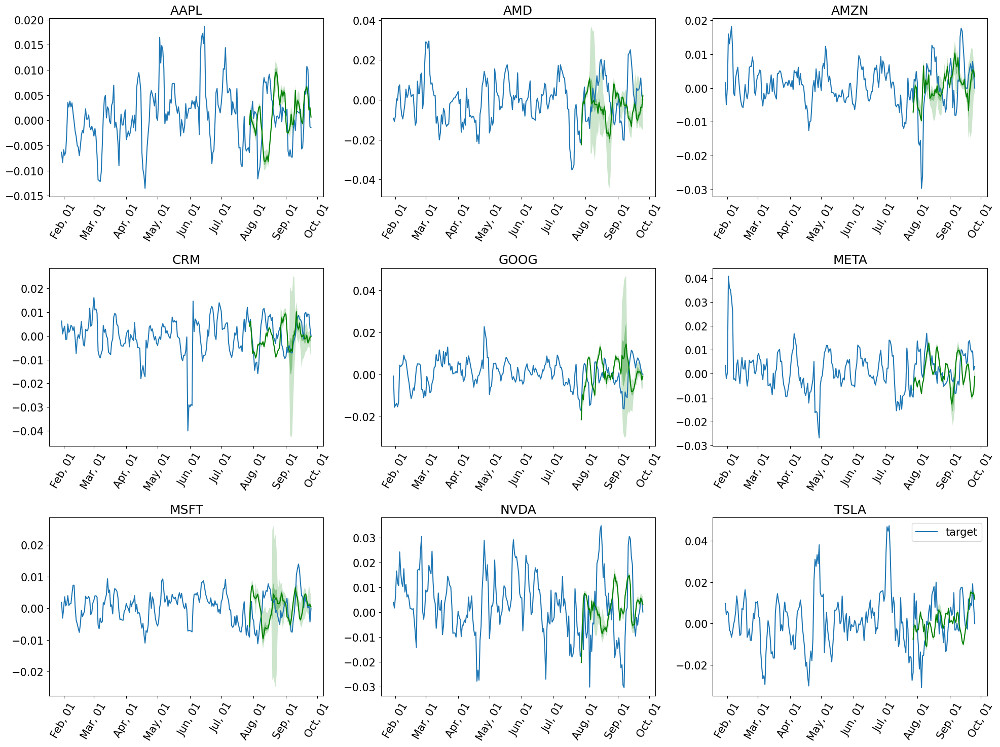

Running evaluation: 9it [00:00, 271.65it/s]
/home/abizard/miniconda3/envs/finetuning/lib/python3.12/site-packages/gluonts/json.py:101: UserWarning: Using `json`-module for json-handling. Consider installing one of `orjson`, `ujson` to speed up serialization and deserialization.
  warnings.warn(


CRPS: 1.176159700258618
WQL: 1.1160868109281998
MSE: 0.00013198934504072424
MAPE: 2.8040979580540966
RMSE: 0.011488661586134576
MASE: 2.0456337861778144


In [17]:
forecasts_new_256_2, tss_new_256_2 = _new_get_lag_llama_predictions("./lightning_logs/version_11 (256, 0,0001)/checkpoints/epoch=49-step=2500.ckpt", \
                                                            test_dataset, prediction_length=prediction_length, device=device,\
                                                            use_rope_scaling=False, num_samples=num_samples)

plt.figure(figsize=(20, 15))
date_formater = mdates.DateFormatter("%b, %d")
plt.rcParams.update({"font.size": 15})

# iterate through the series, plot the predicted samples
for idx, (forecast, ts) in islice(enumerate(zip(forecasts_new_256_2, tss_new_256_2)), 9):
    ax = plt.subplot(3, 3, idx + 1)

    plt.plot(
        ts[(-4 * prediction_length):].to_timestamp(),
        label="target",
    )
    forecast.plot(color="g")
    plt.xticks(rotation=60)
    ax.xaxis.set_major_formatter(date_formater)
    ax.set_title(forecast.item_id)

plt.gcf().tight_layout()
plt.legend()
plt.show()

evaluator = Evaluator()
agg_metrics_256_2, ts_metrics_256_2 = evaluator(iter(tss_new_256_2), iter(forecasts_new_256_2))
print('CRPS:', agg_metrics_256_2['mean_wQuantileLoss'])
print('WQL:', agg_metrics_256_2['wQuantileLoss[0.9]'])
print('MSE:', agg_metrics_256_2['MSE'])
print('MAPE:', agg_metrics_256_2['MAPE'])
print('RMSE:', agg_metrics_256_2['RMSE'])
print('MASE:', agg_metrics_256_2['MASE'])

/home/abizard/miniconda3/envs/finetuning/lib/python3.12/site-packages/lightning/fabric/utilities/cloud_io.py:56: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
/home/abizard/miniconda3/envs/f

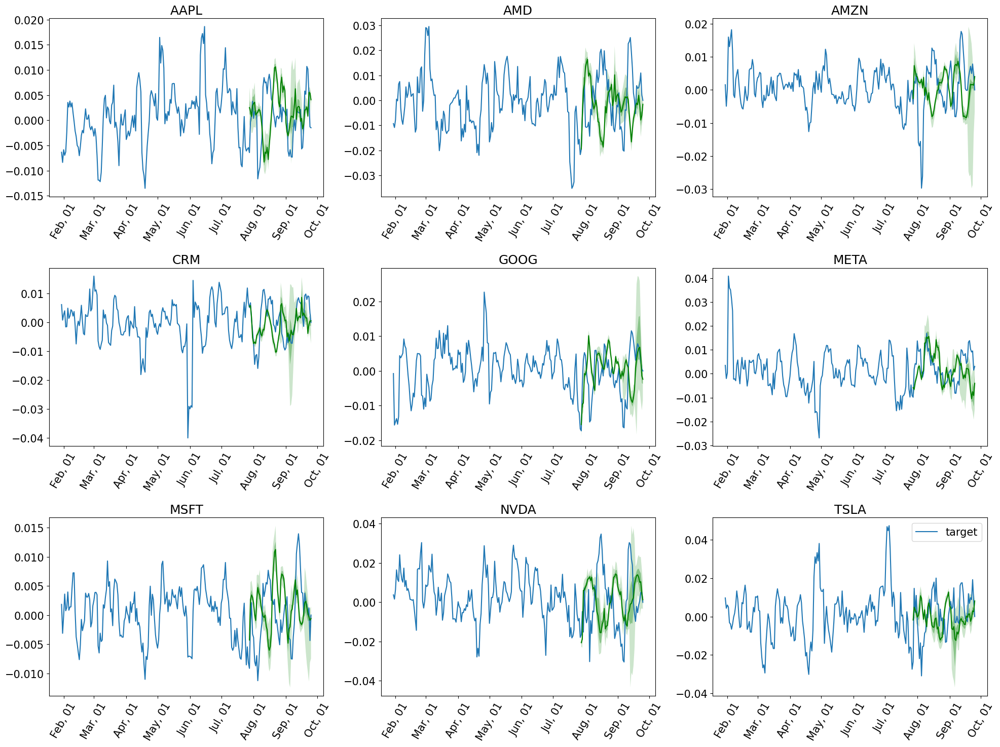

Running evaluation: 9it [00:00, 235.92it/s]


CRPS: 1.2129899148122547
WQL: 1.0320196301835478
MSE: 0.00015356331951571286
MAPE: 3.129116064096799
RMSE: 0.012392066797581138
MASE: 2.120075110999829


/home/abizard/miniconda3/envs/finetuning/lib/python3.12/site-packages/gluonts/json.py:101: UserWarning: Using `json`-module for json-handling. Consider installing one of `orjson`, `ujson` to speed up serialization and deserialization.
  warnings.warn(


In [18]:
forecasts_new_512_2, tss_new_512_2 = _new_get_lag_llama_predictions("./lightning_logs/version_12 (512, 0,0001)/checkpoints/epoch=49-step=2500.ckpt", \
                                                            test_dataset, prediction_length=prediction_length, device=device,\
                                                            use_rope_scaling=False, num_samples=num_samples)

plt.figure(figsize=(20, 15))
date_formater = mdates.DateFormatter("%b, %d")
plt.rcParams.update({"font.size": 15})

# iterate through the series, plot the predicted samples
for idx, (forecast, ts) in islice(enumerate(zip(forecasts_new_512_2, tss_new_512_2)), 9):
    ax = plt.subplot(3, 3, idx + 1)

    plt.plot(
        ts[(-4 * prediction_length):].to_timestamp(),
        label="target",
    )
    forecast.plot(color="g")
    plt.xticks(rotation=60)
    ax.xaxis.set_major_formatter(date_formater)
    ax.set_title(forecast.item_id)

plt.gcf().tight_layout()
plt.legend()
plt.show()

evaluator = Evaluator()
agg_metrics_512_2, ts_metrics_512_2 = evaluator(iter(tss_new_512_2), iter(forecasts_new_512_2))
print('CRPS:', agg_metrics_512_2['mean_wQuantileLoss'])
print('WQL:', agg_metrics_512_2['wQuantileLoss[0.9]'])
print('MSE:', agg_metrics_512_2['MSE'])
print('MAPE:', agg_metrics_512_2['MAPE'])
print('RMSE:', agg_metrics_512_2['RMSE'])
print('MASE:', agg_metrics_512_2['MASE'])

Learning Rate 0,005

/home/abizard/miniconda3/envs/finetuning/lib/python3.12/site-packages/lightning/fabric/utilities/cloud_io.py:56: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
/home/abizard/miniconda3/envs/f

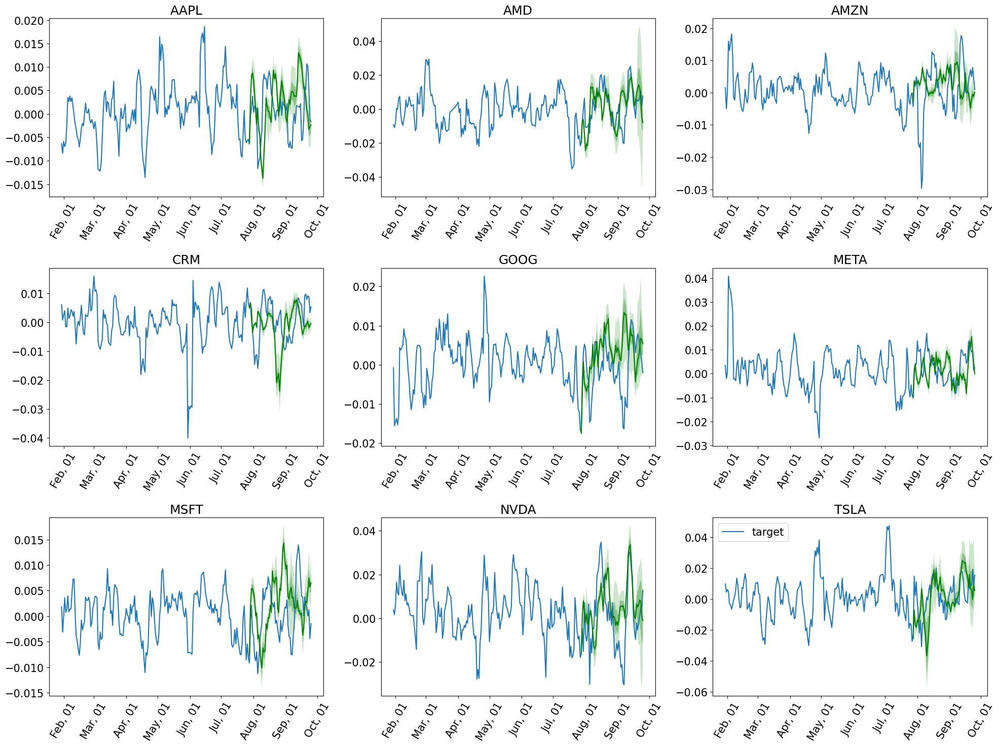

Running evaluation: 9it [00:00, 300.99it/s]
/home/abizard/miniconda3/envs/finetuning/lib/python3.12/site-packages/gluonts/json.py:101: UserWarning: Using `json`-module for json-handling. Consider installing one of `orjson`, `ujson` to speed up serialization and deserialization.
  warnings.warn(


CRPS: 1.0281983517839148
WQL: 0.7465200290658315
MSE: 0.00011302391627665472
MAPE: 4.203220932571976
RMSE: 0.010631270680245834
MASE: 1.9758028082154822


In [6]:
forecasts_new_32_3, tss_new_32_3 = _new_get_lag_llama_predictions("./lightning_logs/version_13 (32, 0,005)/checkpoints/epoch=48-step=2450.ckpt", \
                                                            test_dataset, prediction_length=prediction_length, device=device,\
                                                            use_rope_scaling=False, num_samples=num_samples)

plt.figure(figsize=(20, 15))
date_formater = mdates.DateFormatter("%b, %d")
plt.rcParams.update({"font.size": 15})

# iterate through the series, plot the predicted samples
for idx, (forecast, ts) in islice(enumerate(zip(forecasts_new_32_3, tss_new_32_3)), 9):
    ax = plt.subplot(3, 3, idx + 1)

    plt.plot(
        ts[(-4 * prediction_length):].to_timestamp(),
        label="target",
    )
    forecast.plot(color="g")
    plt.xticks(rotation=60)
    ax.xaxis.set_major_formatter(date_formater)
    ax.set_title(forecast.item_id)

plt.gcf().tight_layout()
plt.legend()
plt.show()

evaluator = Evaluator()
agg_metrics_32_3, ts_metrics_32_3 = evaluator(iter(tss_new_32_3), iter(forecasts_new_32_3))
print('CRPS:', agg_metrics_32_3['mean_wQuantileLoss'])
print('WQL:', agg_metrics_32_3['wQuantileLoss[0.9]'])
print('MSE:', agg_metrics_32_3['MSE'])
print('MAPE:', agg_metrics_32_3['MAPE'])
print('RMSE:', agg_metrics_32_3['RMSE'])
print('MASE:', agg_metrics_32_3['MASE'])

/home/abizard/miniconda3/envs/finetuning/lib/python3.12/site-packages/lightning/fabric/utilities/cloud_io.py:56: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
/home/abizard/miniconda3/envs/f

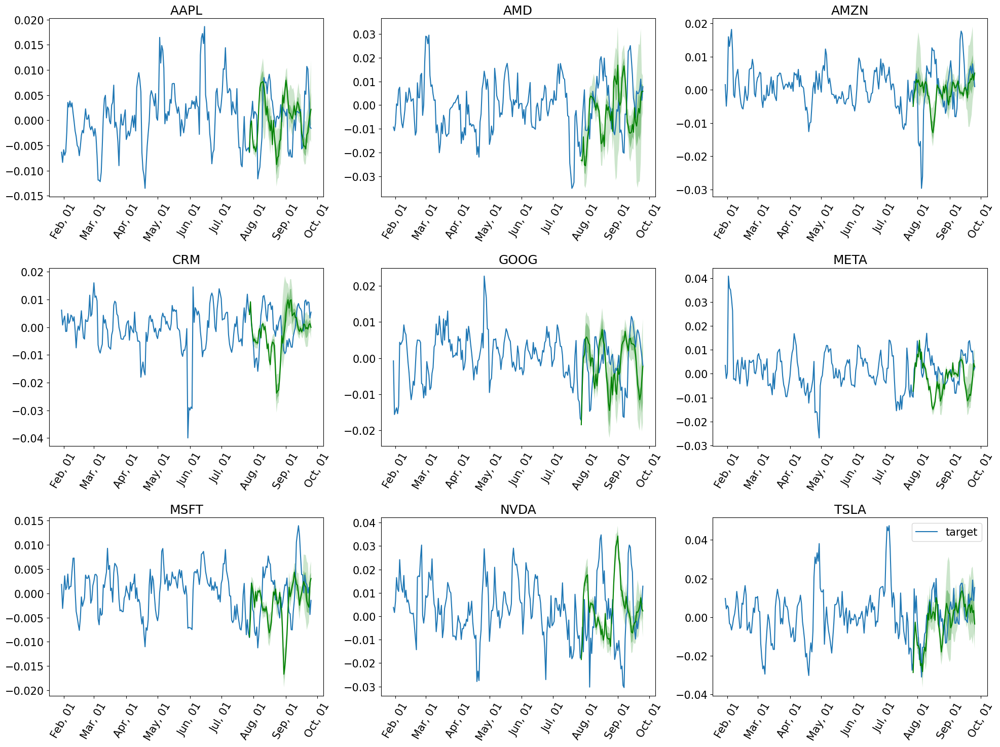

Running evaluation: 9it [00:00, 351.28it/s]


CRPS: 1.223147124797428
WQL: 1.143259961537443
MSE: 0.00016775529365986586
MAPE: 3.402047729492187
RMSE: 0.012952038204848913
MASE: 2.2317423431517676


/home/abizard/miniconda3/envs/finetuning/lib/python3.12/site-packages/gluonts/json.py:101: UserWarning: Using `json`-module for json-handling. Consider installing one of `orjson`, `ujson` to speed up serialization and deserialization.
  warnings.warn(


In [7]:
forecasts_new_64_3, tss_new_64_3 = _new_get_lag_llama_predictions("./lightning_logs/version_14 (64, 0,005)/checkpoints/epoch=48-step=2450.ckpt", \
                                                            test_dataset, prediction_length=prediction_length, device=device,\
                                                            use_rope_scaling=False, num_samples=num_samples)

plt.figure(figsize=(20, 15))
date_formater = mdates.DateFormatter("%b, %d")
plt.rcParams.update({"font.size": 15})

# iterate through the series, plot the predicted samples
for idx, (forecast, ts) in islice(enumerate(zip(forecasts_new_64_3, tss_new_64_3)), 9):
    ax = plt.subplot(3, 3, idx + 1)

    plt.plot(
        ts[(-4 * prediction_length):].to_timestamp(),
        label="target",
    )
    forecast.plot(color="g")
    plt.xticks(rotation=60)
    ax.xaxis.set_major_formatter(date_formater)
    ax.set_title(forecast.item_id)

plt.gcf().tight_layout()
plt.legend()
plt.show()

evaluator = Evaluator()
agg_metrics_64_3, ts_metrics_64_3 = evaluator(iter(tss_new_64_3), iter(forecasts_new_64_3))
print('CRPS:', agg_metrics_64_3['mean_wQuantileLoss'])
print('WQL:', agg_metrics_64_3['wQuantileLoss[0.9]'])
print('MSE:', agg_metrics_64_3['MSE'])
print('MAPE:', agg_metrics_64_3['MAPE'])
print('RMSE:', agg_metrics_64_3['RMSE'])
print('MASE:', agg_metrics_64_3['MASE'])

/home/abizard/miniconda3/envs/finetuning/lib/python3.12/site-packages/lightning/fabric/utilities/cloud_io.py:56: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
/home/abizard/miniconda3/envs/f

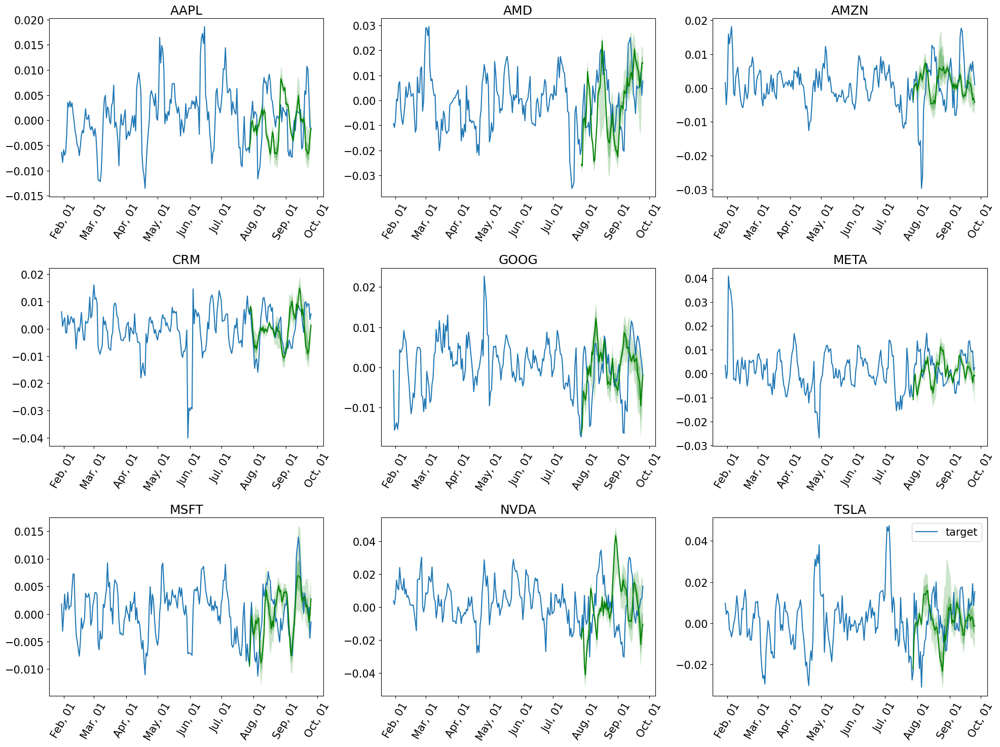

Running evaluation: 9it [00:00, 287.69it/s]


CRPS: 1.1602583414451482
WQL: 0.9596918678919443
MSE: 0.00015925867116527148
MAPE: 4.190699400725188
RMSE: 0.012619773023524293
MASE: 2.0622770607808096


/home/abizard/miniconda3/envs/finetuning/lib/python3.12/site-packages/gluonts/json.py:101: UserWarning: Using `json`-module for json-handling. Consider installing one of `orjson`, `ujson` to speed up serialization and deserialization.
  warnings.warn(


In [8]:
forecasts_new_128_3, tss_new_128_3 = _new_get_lag_llama_predictions("./lightning_logs/version_15 (128, 0,005)/checkpoints/epoch=49-step=2500.ckpt", \
                                                            test_dataset, prediction_length=prediction_length, device=device,\
                                                            use_rope_scaling=False, num_samples=num_samples)

plt.figure(figsize=(20, 15))
date_formater = mdates.DateFormatter("%b, %d")
plt.rcParams.update({"font.size": 15})

# iterate through the series, plot the predicted samples
for idx, (forecast, ts) in islice(enumerate(zip(forecasts_new_128_3, tss_new_128_3)), 9):
    ax = plt.subplot(3, 3, idx + 1)

    plt.plot(
        ts[(-4 * prediction_length):].to_timestamp(),
        label="target",
    )
    forecast.plot(color="g")
    plt.xticks(rotation=60)
    ax.xaxis.set_major_formatter(date_formater)
    ax.set_title(forecast.item_id)

plt.gcf().tight_layout()
plt.legend()
plt.show()

evaluator = Evaluator()
agg_metrics_128_3, ts_metrics_128_3 = evaluator(iter(tss_new_128_3), iter(forecasts_new_128_3))
print('CRPS:', agg_metrics_128_3['mean_wQuantileLoss'])
print('WQL:', agg_metrics_128_3['wQuantileLoss[0.9]'])
print('MSE:', agg_metrics_128_3['MSE'])
print('MAPE:', agg_metrics_128_3['MAPE'])
print('RMSE:', agg_metrics_128_3['RMSE'])
print('MASE:', agg_metrics_128_3['MASE'])

/home/abizard/miniconda3/envs/finetuning/lib/python3.12/site-packages/lightning/fabric/utilities/cloud_io.py:56: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
/home/abizard/miniconda3/envs/f

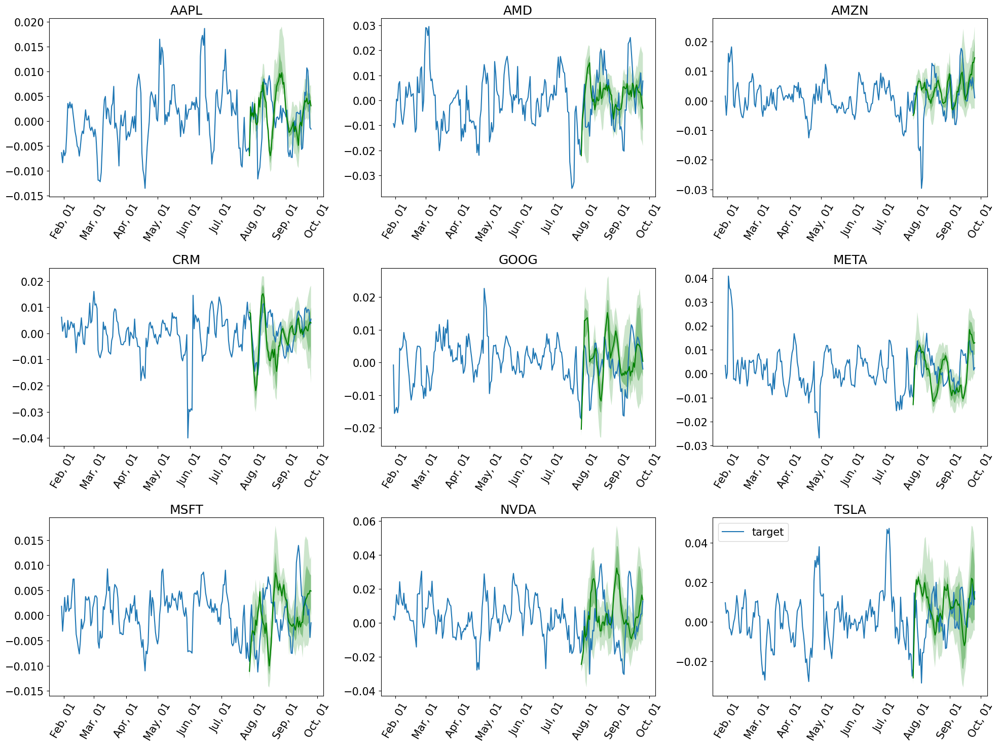

Running evaluation: 9it [00:00, 283.10it/s]
/home/abizard/miniconda3/envs/finetuning/lib/python3.12/site-packages/gluonts/json.py:101: UserWarning: Using `json`-module for json-handling. Consider installing one of `orjson`, `ujson` to speed up serialization and deserialization.
  warnings.warn(


CRPS: 1.0559276658785879
WQL: 0.6743890166416486
MSE: 0.00014561994337580273
MAPE: 3.3412726225676357
RMSE: 0.012067308870489839
MASE: 2.020765265408852


In [9]:
forecasts_new_256_3, tss_new_256_3 = _new_get_lag_llama_predictions("./lightning_logs/version_16 (256, 0,005)/checkpoints/epoch=48-step=2450.ckpt", \
                                                            test_dataset, prediction_length=prediction_length, device=device,\
                                                            use_rope_scaling=False, num_samples=num_samples)

plt.figure(figsize=(20, 15))
date_formater = mdates.DateFormatter("%b, %d")
plt.rcParams.update({"font.size": 15})

# iterate through the series, plot the predicted samples
for idx, (forecast, ts) in islice(enumerate(zip(forecasts_new_256_3, tss_new_256_3)), 9):
    ax = plt.subplot(3, 3, idx + 1)

    plt.plot(
        ts[(-4 * prediction_length):].to_timestamp(),
        label="target",
    )
    forecast.plot(color="g")
    plt.xticks(rotation=60)
    ax.xaxis.set_major_formatter(date_formater)
    ax.set_title(forecast.item_id)

plt.gcf().tight_layout()
plt.legend()
plt.show()

evaluator = Evaluator()
agg_metrics_256_3, ts_metrics_256_3 = evaluator(iter(tss_new_256_3), iter(forecasts_new_256_3))
print('CRPS:', agg_metrics_256_3['mean_wQuantileLoss'])
print('WQL:', agg_metrics_256_3['wQuantileLoss[0.9]'])
print('MSE:', agg_metrics_256_3['MSE'])
print('MAPE:', agg_metrics_256_3['MAPE'])
print('RMSE:', agg_metrics_256_3['RMSE'])
print('MASE:', agg_metrics_256_3['MASE'])

/home/abizard/miniconda3/envs/finetuning/lib/python3.12/site-packages/lightning/fabric/utilities/cloud_io.py:56: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
/home/abizard/miniconda3/envs/f

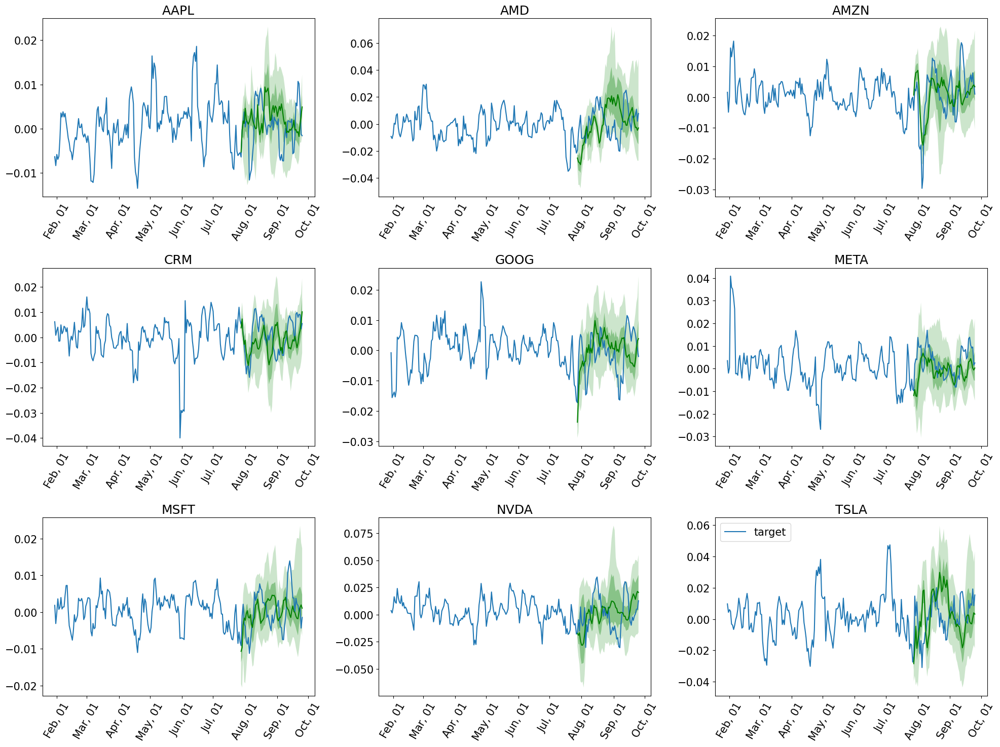

Running evaluation: 9it [00:00, 325.98it/s]


CRPS: 1.028943875204825
WQL: 0.6324974947555706
MSE: 0.00015840519228260276
MAPE: 3.5233394481517646
RMSE: 0.012585912453318701
MASE: 2.0900506882842596


/home/abizard/miniconda3/envs/finetuning/lib/python3.12/site-packages/gluonts/json.py:101: UserWarning: Using `json`-module for json-handling. Consider installing one of `orjson`, `ujson` to speed up serialization and deserialization.
  warnings.warn(


In [10]:
forecasts_new_512_3, tss_new_512_3 = _new_get_lag_llama_predictions("./lightning_logs/version_17 (512, 0,005)/checkpoints/epoch=48-step=2450.ckpt", \
                                                            test_dataset, prediction_length=prediction_length, device=device,\
                                                            use_rope_scaling=False, num_samples=num_samples)

plt.figure(figsize=(20, 15))
date_formater = mdates.DateFormatter("%b, %d")
plt.rcParams.update({"font.size": 15})

# iterate through the series, plot the predicted samples
for idx, (forecast, ts) in islice(enumerate(zip(forecasts_new_512_3, tss_new_512_3)), 9):
    ax = plt.subplot(3, 3, idx + 1)

    plt.plot(
        ts[(-4 * prediction_length):].to_timestamp(),
        label="target",
    )
    forecast.plot(color="g")
    plt.xticks(rotation=60)
    ax.xaxis.set_major_formatter(date_formater)
    ax.set_title(forecast.item_id)

plt.gcf().tight_layout()
plt.legend()
plt.show()

evaluator = Evaluator()
agg_metrics_512_3, ts_metrics_512_3 = evaluator(iter(tss_new_512_3), iter(forecasts_new_512_3))
print('CRPS:', agg_metrics_512_3['mean_wQuantileLoss'])
print('WQL:', agg_metrics_512_3['wQuantileLoss[0.9]'])
print('MSE:', agg_metrics_512_3['MSE'])
print('MAPE:', agg_metrics_512_3['MAPE'])
print('RMSE:', agg_metrics_512_3['RMSE'])
print('MASE:', agg_metrics_512_3['MASE'])

Learning Rate 0,001

/home/abizard/miniconda3/envs/finetuning/lib/python3.12/site-packages/lightning/fabric/utilities/cloud_io.py:56: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
/home/abizard/miniconda3/envs/f

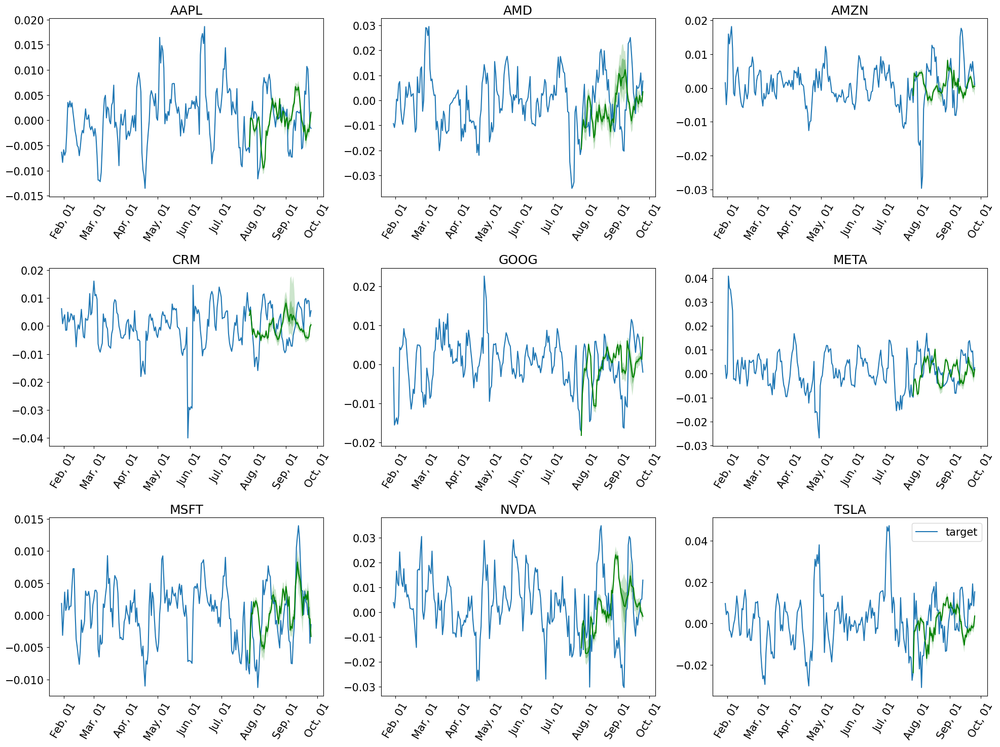

Running evaluation: 9it [00:00, 222.56it/s]


CRPS: 1.126361595656003
WQL: 1.104428387287294
MSE: 0.00012551008430482062
MAPE: 2.7833305076316552
RMSE: 0.011203128326713954
MASE: 1.9083137864469526


/home/abizard/miniconda3/envs/finetuning/lib/python3.12/site-packages/gluonts/json.py:101: UserWarning: Using `json`-module for json-handling. Consider installing one of `orjson`, `ujson` to speed up serialization and deserialization.
  warnings.warn(


In [8]:
forecasts_new_32_4, tss_new_32_4 = _new_get_lag_llama_predictions("./lightning_logs/version_18 (32, 0,001)/checkpoints/epoch=47-step=2400.ckpt", \
                                                            test_dataset, prediction_length=prediction_length, device=device,\
                                                            use_rope_scaling=False, num_samples=num_samples)

plt.figure(figsize=(20, 15))
date_formater = mdates.DateFormatter("%b, %d")
plt.rcParams.update({"font.size": 15})

# iterate through the series, plot the predicted samples
for idx, (forecast, ts) in islice(enumerate(zip(forecasts_new_32_4, tss_new_32_4)), 9):
    ax = plt.subplot(3, 3, idx + 1)

    plt.plot(
        ts[(-4 * prediction_length):].to_timestamp(),
        label="target",
    )
    forecast.plot(color="g")
    plt.xticks(rotation=60)
    ax.xaxis.set_major_formatter(date_formater)
    ax.set_title(forecast.item_id)

plt.gcf().tight_layout()
plt.legend()
plt.show()

evaluator = Evaluator()
agg_metrics_32_4, ts_metrics_32_4 = evaluator(iter(tss_new_32_4), iter(forecasts_new_32_4))
print('CRPS:', agg_metrics_32_4['mean_wQuantileLoss'])
print('WQL:', agg_metrics_32_4['wQuantileLoss[0.9]'])
print('MSE:', agg_metrics_32_4['MSE'])
print('MAPE:', agg_metrics_32_4['MAPE'])
print('RMSE:', agg_metrics_32_4['RMSE'])
print('MASE:', agg_metrics_32_4['MASE'])

/home/abizard/miniconda3/envs/finetuning/lib/python3.12/site-packages/lightning/fabric/utilities/cloud_io.py:56: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
/home/abizard/miniconda3/envs/f

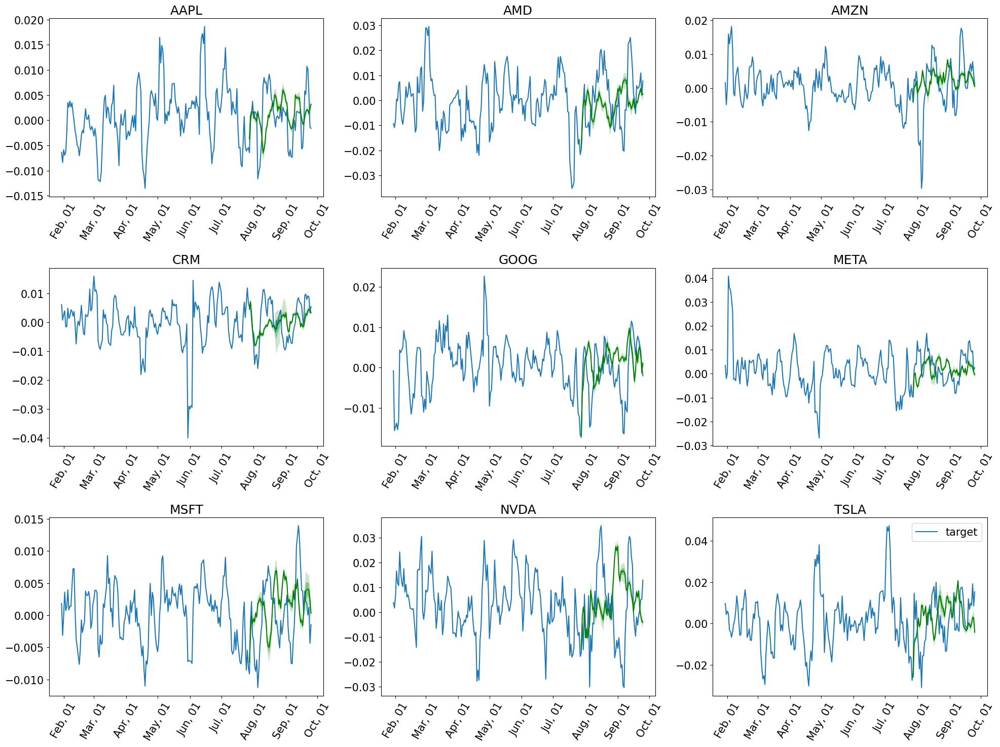

Running evaluation: 9it [00:00, 285.71it/s]
/home/abizard/miniconda3/envs/finetuning/lib/python3.12/site-packages/gluonts/json.py:101: UserWarning: Using `json`-module for json-handling. Consider installing one of `orjson`, `ujson` to speed up serialization and deserialization.
  warnings.warn(


CRPS: 1.0771733468546012
WQL: 0.9034986944449682
MSE: 0.00012187072554499737
MAPE: 2.9542536982783565
RMSE: 0.011039507486523
MASE: 1.8054578296844899


In [9]:
forecasts_new_64_4, tss_new_64_4 = _new_get_lag_llama_predictions("./lightning_logs/version_19 (64, 0,001)/checkpoints/epoch=42-step=2150.ckpt", \
                                                            test_dataset, prediction_length=prediction_length, device=device,\
                                                            use_rope_scaling=False, num_samples=num_samples)

plt.figure(figsize=(20, 15))
date_formater = mdates.DateFormatter("%b, %d")
plt.rcParams.update({"font.size": 15})

# iterate through the series, plot the predicted samples
for idx, (forecast, ts) in islice(enumerate(zip(forecasts_new_64_4, tss_new_64_4)), 9):
    ax = plt.subplot(3, 3, idx + 1)

    plt.plot(
        ts[(-4 * prediction_length):].to_timestamp(),
        label="target",
    )
    forecast.plot(color="g")
    plt.xticks(rotation=60)
    ax.xaxis.set_major_formatter(date_formater)
    ax.set_title(forecast.item_id)

plt.gcf().tight_layout()
plt.legend()
plt.show()

evaluator = Evaluator()
agg_metrics_64_4, ts_metrics_64_4 = evaluator(iter(tss_new_64_4), iter(forecasts_new_64_4))
print('CRPS:', agg_metrics_64_4['mean_wQuantileLoss'])
print('WQL:', agg_metrics_64_4['wQuantileLoss[0.9]'])
print('MSE:', agg_metrics_64_4['MSE'])
print('MAPE:', agg_metrics_64_4['MAPE'])
print('RMSE:', agg_metrics_64_4['RMSE'])
print('MASE:', agg_metrics_64_4['MASE'])

/home/abizard/miniconda3/envs/finetuning/lib/python3.12/site-packages/lightning/fabric/utilities/cloud_io.py:56: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
/home/abizard/miniconda3/envs/f

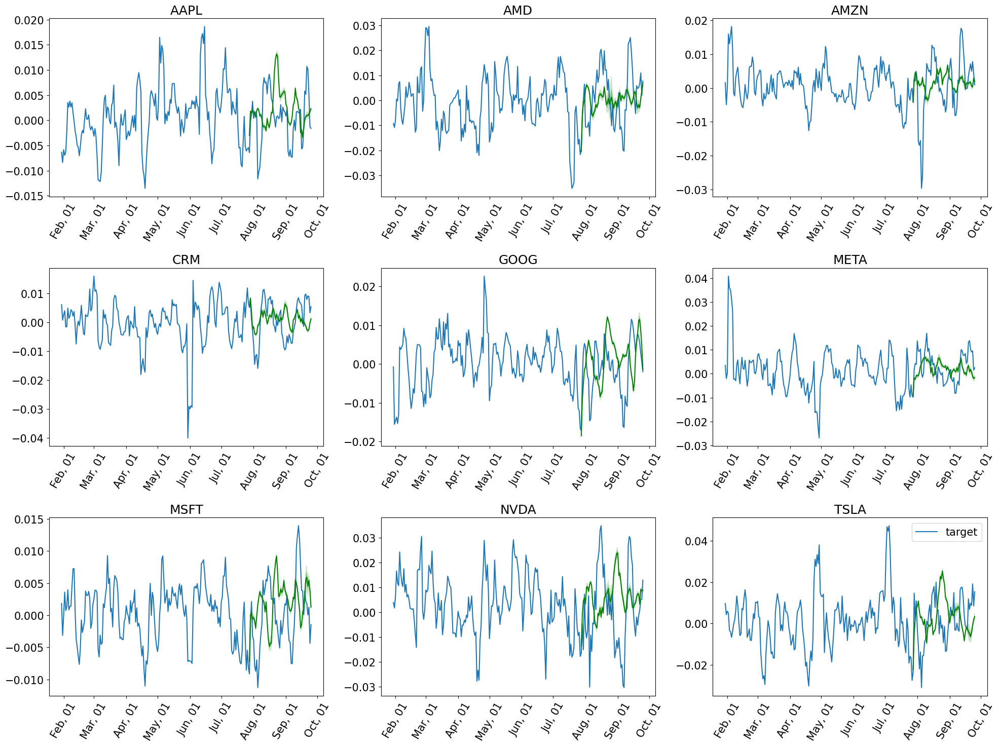

Running evaluation: 9it [00:00, 304.03it/s]


CRPS: 1.1351449174286226
WQL: 0.9456453190465284
MSE: 0.00012265534433363764
MAPE: 3.252847812793873
RMSE: 0.01107498732882515
MASE: 1.8980231061446007


/home/abizard/miniconda3/envs/finetuning/lib/python3.12/site-packages/gluonts/json.py:101: UserWarning: Using `json`-module for json-handling. Consider installing one of `orjson`, `ujson` to speed up serialization and deserialization.
  warnings.warn(


In [10]:
forecasts_new_128_4, tss_new_128_4 = _new_get_lag_llama_predictions("./lightning_logs/version_20 (128, 0,001)/checkpoints/epoch=49-step=2500.ckpt", \
                                                            test_dataset, prediction_length=prediction_length, device=device,\
                                                            use_rope_scaling=False, num_samples=num_samples)

plt.figure(figsize=(20, 15))
date_formater = mdates.DateFormatter("%b, %d")
plt.rcParams.update({"font.size": 15})

# iterate through the series, plot the predicted samples
for idx, (forecast, ts) in islice(enumerate(zip(forecasts_new_128_4, tss_new_128_4)), 9):
    ax = plt.subplot(3, 3, idx + 1)

    plt.plot(
        ts[(-4 * prediction_length):].to_timestamp(),
        label="target",
    )
    forecast.plot(color="g")
    plt.xticks(rotation=60)
    ax.xaxis.set_major_formatter(date_formater)
    ax.set_title(forecast.item_id)

plt.gcf().tight_layout()
plt.legend()
plt.show()

evaluator = Evaluator()
agg_metrics_128_4, ts_metrics_128_4 = evaluator(iter(tss_new_128_4), iter(forecasts_new_128_4))
print('CRPS:', agg_metrics_128_4['mean_wQuantileLoss'])
print('WQL:', agg_metrics_128_4['wQuantileLoss[0.9]'])
print('MSE:', agg_metrics_128_4['MSE'])
print('MAPE:', agg_metrics_128_4['MAPE'])
print('RMSE:', agg_metrics_128_4['RMSE'])
print('MASE:', agg_metrics_128_4['MASE'])

/home/abizard/miniconda3/envs/finetuning/lib/python3.12/site-packages/lightning/fabric/utilities/cloud_io.py:56: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
/home/abizard/miniconda3/envs/f

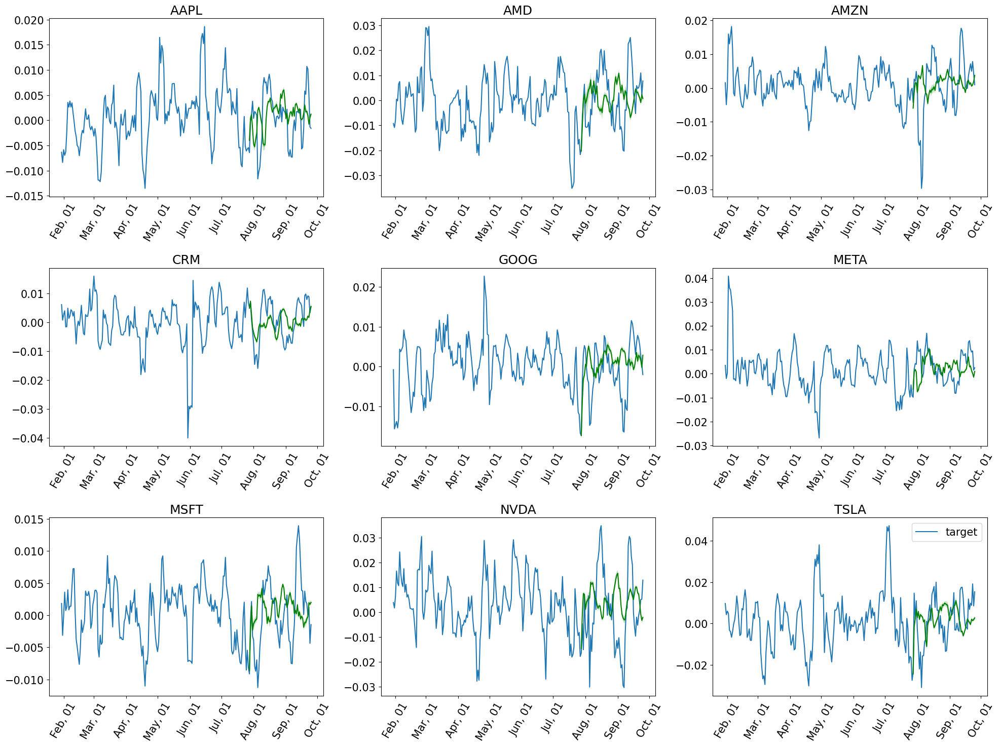

Running evaluation: 9it [00:00, 253.01it/s]


CRPS: 1.0732642981799627
WQL: 0.9629515813086571
MSE: 0.00010888221139019286
MAPE: 2.3735968978316695
RMSE: 0.010434663932786376
MASE: 1.7697675860175177


/home/abizard/miniconda3/envs/finetuning/lib/python3.12/site-packages/gluonts/json.py:101: UserWarning: Using `json`-module for json-handling. Consider installing one of `orjson`, `ujson` to speed up serialization and deserialization.
  warnings.warn(


In [11]:
forecasts_new_256_4, tss_new_256_4 = _new_get_lag_llama_predictions("./lightning_logs/version_21 (256, 0,001)/checkpoints/epoch=49-step=2500.ckpt", \
                                                            test_dataset, prediction_length=prediction_length, device=device,\
                                                            use_rope_scaling=False, num_samples=num_samples)

plt.figure(figsize=(20, 15))
date_formater = mdates.DateFormatter("%b, %d")
plt.rcParams.update({"font.size": 15})

# iterate through the series, plot the predicted samples
for idx, (forecast, ts) in islice(enumerate(zip(forecasts_new_256_4, tss_new_256_4)), 9):
    ax = plt.subplot(3, 3, idx + 1)

    plt.plot(
        ts[(-4 * prediction_length):].to_timestamp(),
        label="target",
    )
    forecast.plot(color="g")
    plt.xticks(rotation=60)
    ax.xaxis.set_major_formatter(date_formater)
    ax.set_title(forecast.item_id)

plt.gcf().tight_layout()
plt.legend()
plt.show()

evaluator = Evaluator()
agg_metrics_256_4, ts_metrics_256_4 = evaluator(iter(tss_new_256_4), iter(forecasts_new_256_4))
print('CRPS:', agg_metrics_256_4['mean_wQuantileLoss'])
print('WQL:', agg_metrics_256_4['wQuantileLoss[0.9]'])
print('MSE:', agg_metrics_256_4['MSE'])
print('MAPE:', agg_metrics_256_4['MAPE'])
print('RMSE:', agg_metrics_256_4['RMSE'])
print('MASE:', agg_metrics_256_4['MASE'])

/home/abizard/miniconda3/envs/finetuning/lib/python3.12/site-packages/lightning/fabric/utilities/cloud_io.py:56: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
/home/abizard/miniconda3/envs/f

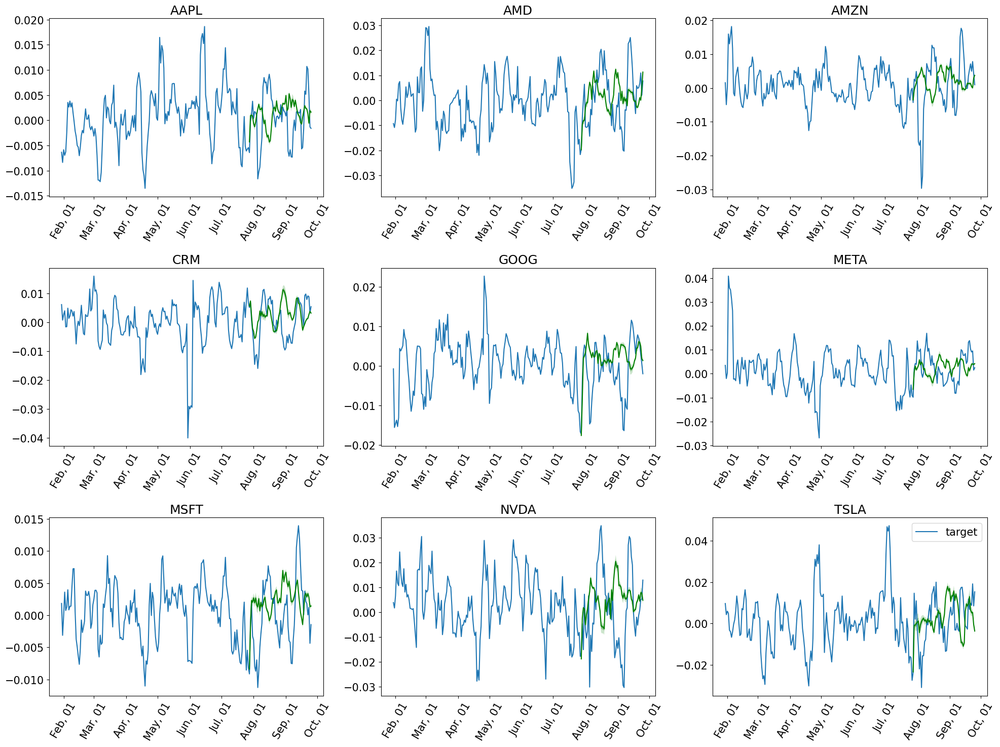

Running evaluation: 9it [00:00, 207.17it/s]


CRPS: 1.1149021051248438
WQL: 0.9048191660182701
MSE: 0.00011982930030811715
MAPE: 3.2223186634205008
RMSE: 0.010946657038023853
MASE: 1.8473675450582552


/home/abizard/miniconda3/envs/finetuning/lib/python3.12/site-packages/gluonts/json.py:101: UserWarning: Using `json`-module for json-handling. Consider installing one of `orjson`, `ujson` to speed up serialization and deserialization.
  warnings.warn(


In [12]:
forecasts_new_512_4, tss_new_512_4 = _new_get_lag_llama_predictions("./lightning_logs/version_22 (512, 0,001)/checkpoints/epoch=46-step=2350.ckpt", \
                                                            test_dataset, prediction_length=prediction_length, device=device,\
                                                            use_rope_scaling=False, num_samples=num_samples)

plt.figure(figsize=(20, 15))
date_formater = mdates.DateFormatter("%b, %d")
plt.rcParams.update({"font.size": 15})

# iterate through the series, plot the predicted samples
for idx, (forecast, ts) in islice(enumerate(zip(forecasts_new_512_4, tss_new_512_4)), 9):
    ax = plt.subplot(3, 3, idx + 1)

    plt.plot(
        ts[(-4 * prediction_length):].to_timestamp(),
        label="target",
    )
    forecast.plot(color="g")
    plt.xticks(rotation=60)
    ax.xaxis.set_major_formatter(date_formater)
    ax.set_title(forecast.item_id)

plt.gcf().tight_layout()
plt.legend()
plt.show()

evaluator = Evaluator()
agg_metrics_512_4, ts_metrics_512_4 = evaluator(iter(tss_new_512_4), iter(forecasts_new_512_4))
print('CRPS:', agg_metrics_512_4['mean_wQuantileLoss'])
print('WQL:', agg_metrics_512_4['wQuantileLoss[0.9]'])
print('MSE:', agg_metrics_512_4['MSE'])
print('MAPE:', agg_metrics_512_4['MAPE'])
print('RMSE:', agg_metrics_512_4['RMSE'])
print('MASE:', agg_metrics_512_4['MASE'])

Learning Rate 0,01

/home/abizard/miniconda3/envs/finetuning/lib/python3.12/site-packages/lightning/fabric/utilities/cloud_io.py:56: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
/home/abizard/miniconda3/envs/f

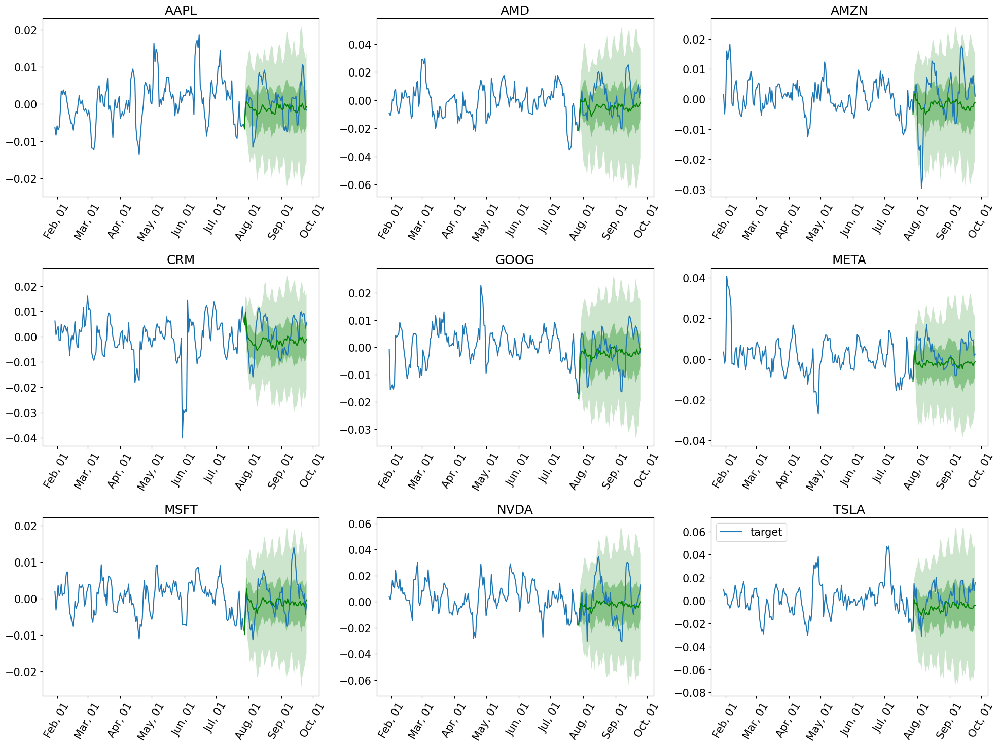

Running evaluation: 9it [00:00, 292.08it/s]
/home/abizard/miniconda3/envs/finetuning/lib/python3.12/site-packages/gluonts/json.py:101: UserWarning: Using `json`-module for json-handling. Consider installing one of `orjson`, `ujson` to speed up serialization and deserialization.
  warnings.warn(


CRPS: 0.8761518019704166
WQL: 0.4458739407091846
MSE: 0.0001066514086064503
MAPE: 2.260623338487413
RMSE: 0.010327216885804728
MASE: 1.7505529288222232


In [13]:
forecasts_new_32_5, tss_new_32_5 = _new_get_lag_llama_predictions("./lightning_logs/version_23 (32, 0,01)/checkpoints/epoch=47-step=2400.ckpt", \
                                                            test_dataset, prediction_length=prediction_length, device=device,\
                                                            use_rope_scaling=False, num_samples=num_samples)

plt.figure(figsize=(20, 15))
date_formater = mdates.DateFormatter("%b, %d")
plt.rcParams.update({"font.size": 15})

# iterate through the series, plot the predicted samples
for idx, (forecast, ts) in islice(enumerate(zip(forecasts_new_32_5, tss_new_32_5)), 9):
    ax = plt.subplot(3, 3, idx + 1)

    plt.plot(
        ts[(-4 * prediction_length):].to_timestamp(),
        label="target",
    )
    forecast.plot(color="g")
    plt.xticks(rotation=60)
    ax.xaxis.set_major_formatter(date_formater)
    ax.set_title(forecast.item_id)

plt.gcf().tight_layout()
plt.legend()
plt.show()

evaluator = Evaluator()
agg_metrics_32_5, ts_metrics_32_5 = evaluator(iter(tss_new_32_5), iter(forecasts_new_32_5))
print('CRPS:', agg_metrics_32_5['mean_wQuantileLoss'])
print('WQL:', agg_metrics_32_5['wQuantileLoss[0.9]'])
print('MSE:', agg_metrics_32_5['MSE'])
print('MAPE:', agg_metrics_32_5['MAPE'])
print('RMSE:', agg_metrics_32_5['RMSE'])
print('MASE:', agg_metrics_32_5['MASE'])

/home/abizard/miniconda3/envs/finetuning/lib/python3.12/site-packages/lightning/fabric/utilities/cloud_io.py:56: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
/home/abizard/miniconda3/envs/f

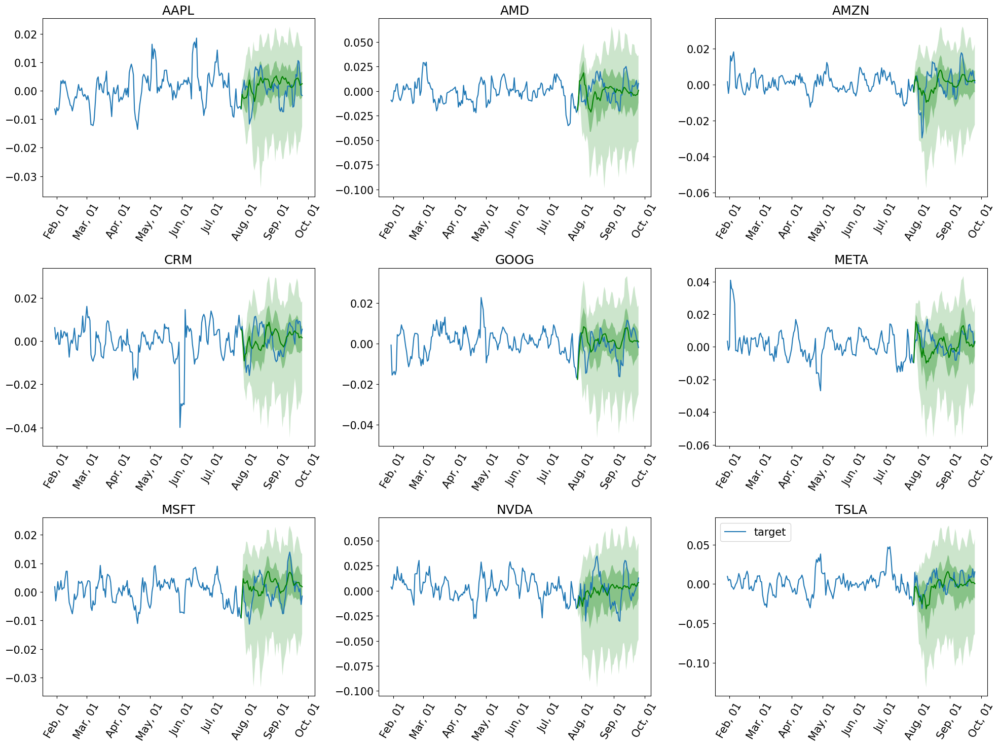

Running evaluation: 9it [00:00, 1363.80it/s]


CRPS: 0.9493679323704526
WQL: 0.5400536030553568
MSE: 0.00012843644190407182
MAPE: 3.390415050365307
RMSE: 0.011332980274582315
MASE: 1.7917957134785967


/home/abizard/miniconda3/envs/finetuning/lib/python3.12/site-packages/gluonts/json.py:101: UserWarning: Using `json`-module for json-handling. Consider installing one of `orjson`, `ujson` to speed up serialization and deserialization.
  warnings.warn(


In [14]:
forecasts_new_64_5, tss_new_64_5 = _new_get_lag_llama_predictions("./lightning_logs/version_24 (64, 0,01)/checkpoints/epoch=49-step=2500.ckpt", \
                                                            test_dataset, prediction_length=prediction_length, device=device,\
                                                            use_rope_scaling=False, num_samples=num_samples)

plt.figure(figsize=(20, 15))
date_formater = mdates.DateFormatter("%b, %d")
plt.rcParams.update({"font.size": 15})

# iterate through the series, plot the predicted samples
for idx, (forecast, ts) in islice(enumerate(zip(forecasts_new_64_5, tss_new_64_5)), 9):
    ax = plt.subplot(3, 3, idx + 1)

    plt.plot(
     ts[(-4 * prediction_length):].to_timestamp(),
        label="target",
    )
    forecast.plot(color="g")
    plt.xticks(rotation=60)
    ax.xaxis.set_major_formatter(date_formater)
    ax.set_title(forecast.item_id)

plt.gcf().tight_layout()
plt.legend()
plt.show()

evaluator = Evaluator()
agg_metrics_64_5, ts_metrics_64_5 = evaluator(iter(tss_new_64_5), iter(forecasts_new_64_5))
print('CRPS:', agg_metrics_64_5['mean_wQuantileLoss'])
print('WQL:', agg_metrics_64_5['wQuantileLoss[0.9]'])
print('MSE:', agg_metrics_64_5['MSE'])
print('MAPE:', agg_metrics_64_5['MAPE'])
print('RMSE:', agg_metrics_64_5['RMSE'])
print('MASE:', agg_metrics_64_5['MASE'])

/home/abizard/miniconda3/envs/finetuning/lib/python3.12/site-packages/lightning/fabric/utilities/cloud_io.py:56: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
/home/abizard/miniconda3/envs/f

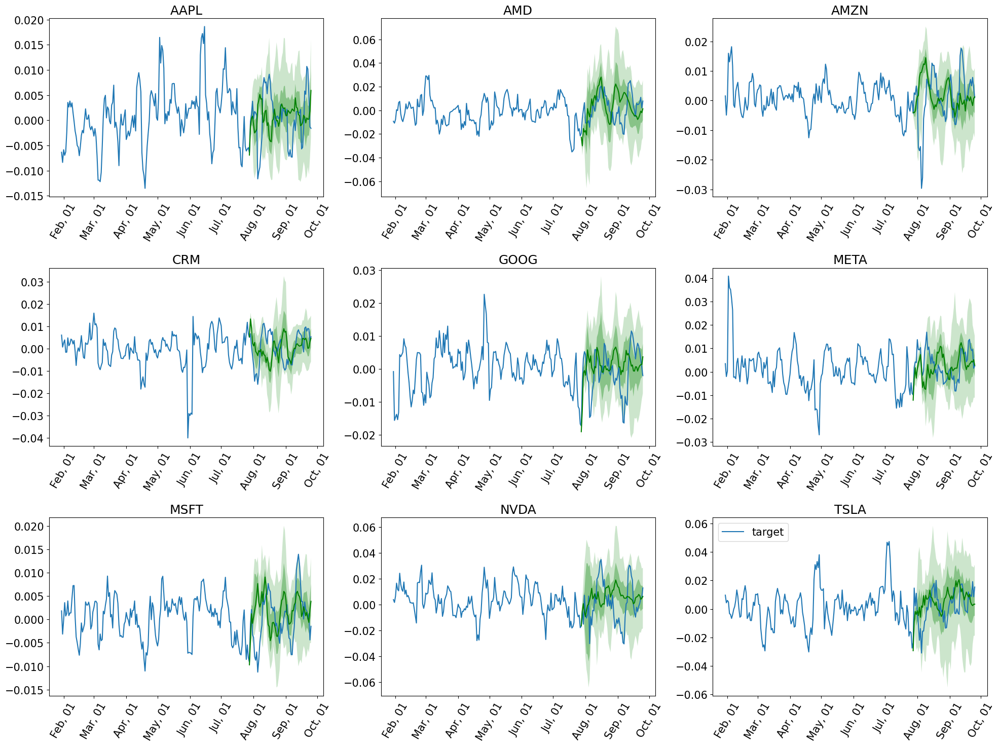

Running evaluation: 9it [00:00, 1437.39it/s]


CRPS: 0.9445657295263052
WQL: 0.5378952055321995
MSE: 0.00012438316372464654
MAPE: 2.8437448854799623
RMSE: 0.011152720014626322
MASE: 1.9181444378016108


/home/abizard/miniconda3/envs/finetuning/lib/python3.12/site-packages/gluonts/json.py:101: UserWarning: Using `json`-module for json-handling. Consider installing one of `orjson`, `ujson` to speed up serialization and deserialization.
  warnings.warn(


In [15]:
forecasts_new_128_5, tss_new_128_5 = _new_get_lag_llama_predictions("./lightning_logs/version_25 (128, 0,01)/checkpoints/epoch=49-step=2500.ckpt", \
                                                            test_dataset, prediction_length=prediction_length, device=device,\
                                                            use_rope_scaling=False, num_samples=num_samples)

plt.figure(figsize=(20, 15))
date_formater = mdates.DateFormatter("%b, %d")
plt.rcParams.update({"font.size": 15})

# iterate through the series, plot the predicted samples
for idx, (forecast, ts) in islice(enumerate(zip(forecasts_new_128_5, tss_new_128_5)), 9):
    ax = plt.subplot(3, 3, idx + 1)

    plt.plot(
        ts[(-4 * prediction_length):].to_timestamp(),
        label="target",
    )
    forecast.plot(color="g")
    plt.xticks(rotation=60)
    ax.xaxis.set_major_formatter(date_formater)
    ax.set_title(forecast.item_id)

plt.gcf().tight_layout()
plt.legend()
plt.show()

evaluator = Evaluator()
agg_metrics_128_5, ts_metrics_128_5 = evaluator(iter(tss_new_128_5), iter(forecasts_new_128_5))
print('CRPS:', agg_metrics_128_5['mean_wQuantileLoss'])
print('WQL:', agg_metrics_128_5['wQuantileLoss[0.9]'])
print('MSE:', agg_metrics_128_5['MSE'])
print('MAPE:', agg_metrics_128_5['MAPE'])
print('RMSE:', agg_metrics_128_5['RMSE'])
print('MASE:', agg_metrics_128_5['MASE'])

/home/abizard/miniconda3/envs/finetuning/lib/python3.12/site-packages/lightning/fabric/utilities/cloud_io.py:56: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
/home/abizard/miniconda3/envs/f

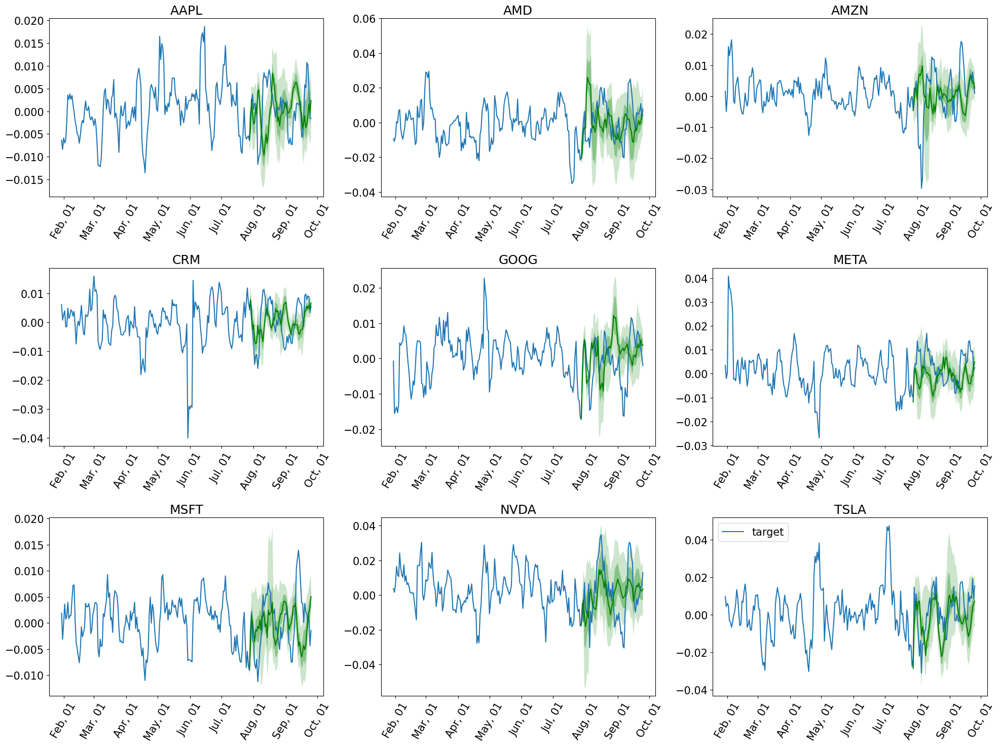

Running evaluation: 9it [00:00, 207.33it/s]


CRPS: 0.9238504047799169
WQL: 0.553946577910065
MSE: 0.00011359928132690213
MAPE: 2.8388624544496888
RMSE: 0.01065829636137512
MASE: 1.8809979583054524


/home/abizard/miniconda3/envs/finetuning/lib/python3.12/site-packages/gluonts/json.py:101: UserWarning: Using `json`-module for json-handling. Consider installing one of `orjson`, `ujson` to speed up serialization and deserialization.
  warnings.warn(


In [16]:
forecasts_new_256_5, tss_new_256_5 = _new_get_lag_llama_predictions("./lightning_logs/version_26 (256, 0,01)/checkpoints/epoch=46-step=2350.ckpt", \
                                                            test_dataset, prediction_length=prediction_length, device=device,\
                                                            use_rope_scaling=False, num_samples=num_samples)

plt.figure(figsize=(20, 15))
date_formater = mdates.DateFormatter("%b, %d")
plt.rcParams.update({"font.size": 15})

# iterate through the series, plot the predicted samples
for idx, (forecast, ts) in islice(enumerate(zip(forecasts_new_256_5, tss_new_256_5)), 9):
    ax = plt.subplot(3, 3, idx + 1)

    plt.plot(
        ts[(-4 * prediction_length):].to_timestamp(),
        label="target",
    )
    forecast.plot(color="g")
    plt.xticks(rotation=60)
    ax.xaxis.set_major_formatter(date_formater)
    ax.set_title(forecast.item_id)

plt.gcf().tight_layout()
plt.legend()
plt.show()

evaluator = Evaluator()
agg_metrics_256_5, ts_metrics_256_5 = evaluator(iter(tss_new_256_5), iter(forecasts_new_256_5))
print('CRPS:', agg_metrics_256_5['mean_wQuantileLoss'])
print('WQL:', agg_metrics_256_5['wQuantileLoss[0.9]'])
print('MSE:', agg_metrics_256_5['MSE'])
print('MAPE:', agg_metrics_256_5['MAPE'])
print('RMSE:', agg_metrics_256_5['RMSE'])
print('MASE:', agg_metrics_256_5['MASE'])

/home/abizard/miniconda3/envs/finetuning/lib/python3.12/site-packages/lightning/fabric/utilities/cloud_io.py:56: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
/home/abizard/miniconda3/envs/f

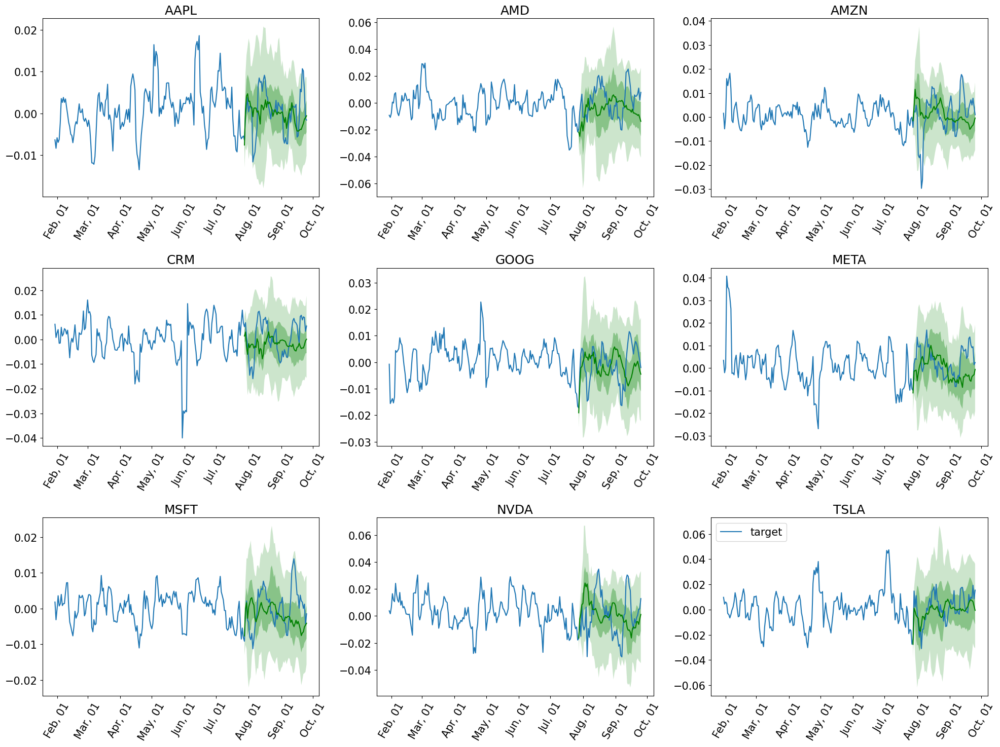

Running evaluation: 9it [00:00, 255.04it/s]
/home/abizard/miniconda3/envs/finetuning/lib/python3.12/site-packages/gluonts/json.py:101: UserWarning: Using `json`-module for json-handling. Consider installing one of `orjson`, `ujson` to speed up serialization and deserialization.
  warnings.warn(


CRPS: 0.9226946987623058
WQL: 0.47465779744703107
MSE: 0.00012185763981607226
MAPE: 3.5146808059127244
RMSE: 0.011038914793405748
MASE: 1.9090259713526596


In [17]:
forecasts_new_512_5, tss_new_512_5 = _new_get_lag_llama_predictions("./lightning_logs/version_27 (512, 0,01)/checkpoints/epoch=48-step=2450.ckpt", \
                                                            test_dataset, prediction_length=prediction_length, device=device,\
                                                            use_rope_scaling=False, num_samples=num_samples)

plt.figure(figsize=(20, 15))
date_formater = mdates.DateFormatter("%b, %d")
plt.rcParams.update({"font.size": 15})

# iterate through the series, plot the predicted samples
for idx, (forecast, ts) in islice(enumerate(zip(forecasts_new_512_5, tss_new_512_5)), 9):
    ax = plt.subplot(3, 3, idx + 1)

    plt.plot(
        ts[(-4 * prediction_length):].to_timestamp(),
        label="target",
    )
    forecast.plot(color="g")
    plt.xticks(rotation=60)
    ax.xaxis.set_major_formatter(date_formater)
    ax.set_title(forecast.item_id)

plt.gcf().tight_layout()
plt.legend()
plt.show()

evaluator = Evaluator()
agg_metrics_512_5, ts_metrics_512_5 = evaluator(iter(tss_new_512_5), iter(forecasts_new_512_5))
print('CRPS:', agg_metrics_512_5['mean_wQuantileLoss'])
print('WQL:', agg_metrics_512_5['wQuantileLoss[0.9]'])
print('MSE:', agg_metrics_512_5['MSE'])
print('MAPE:', agg_metrics_512_5['MAPE'])
print('RMSE:', agg_metrics_512_5['RMSE'])
print('MASE:', agg_metrics_512_5['MASE'])